# Importing

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Import libraries

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.metrics import mean_squared_error, mean_absolute_error
import xgboost as xgb

In [ ]:
!pip install shap
import shap

In [ ]:
#  get a list of yml files
dir_path = os.path.join("/content/drive/My Drive/", "UBS_Challenge")
df_dir_path = os.path.join("/content/drive/My Drive/", "UBS_Challenge", "df_save")

In [ ]:
# Load the DataFrame from the pickle file
loaded_df = pd.read_pickle(os.path.join(df_dir_path, "dummyTrade1_Expiry_3y_Tenor_3y.pkl"))

# Display the loaded DataFrame
loaded_df

,index,Date,Expiry,Tenor,Swap Rate,atm-1.0%,atm-0.5%,atm,atm+0.5%,atm+1.0%,...,Vega shock -25,Vega shock -10,Vega shock -5,Vega shock 0,Vega shock 5,Vega shock 10,Vega shock 25,Vega shock 50,Vega shock 75,Vega shock 100
0,0,2021-01-13,3y,3y,0.926464,0.126845,0.097976,0.064286,0.101715,0.138284,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,2021-01-15,3y,3y,0.909138,0.126421,0.098006,0.063943,0.101482,0.138040,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,2021-01-18,3y,3y,0.911595,0.126314,0.097693,0.063760,0.101355,0.137900,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,2021-01-19,3y,3y,0.897848,0.125957,0.095190,0.063558,0.101041,0.137519,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,2021-01-20,3y,3y,0.906676,0.126691,0.092632,0.064357,0.101635,0.138296,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
749,749,2024-01-08,3y,3y,3.110386,1.062981,1.065748,1.078728,1.101962,1.134488,...,13.054805,7.837098,11.382627,-10.217085,3.250830,-1.691202,-10.995377,2.988663,-1.774008,3.453038
750,750,2024-01-09,3y,3y,3.118041,1.053326,1.056185,1.069095,1.092077,1.124198,...,14.845626,12.220682,8.190720,3.654435,0.465170,-8.901062,1.681433,5.394763,0.341371,2.448011
751,751,2024-01-10,3y,3y,3.124089,1.078360,1.082165,1.095708,1.118975,1.151090,...,17.525630,0.038723,5.626285,-1.941919,1.514918,-6.057274,5.861185,5.004043,5.190675,4.022827
752,752,2024-01-11,3y,3y,3.080200,1.087504,1.092564,1.106701,1.129842,1.161218,...,8.916819,22.398760,21.049154,10.951858,4.202208,2.800921,-0.382249,-8.216384,7.142869,8.110645


# XGBoost Model Prediction, Product: Expiry 3y Tenor 3y

## Data Preprocessing

Explanation:

We try to predict 'Vega MA t+1 to t+5' (MA means moving average). In doing so, we classify the data into various clusters using kNN analysis. The Silhouette Analysis graph will tell us what is the optimal number of clusters (higher Silhouette score means more optimal).

We also consider that 'Vega MA t+1 to t+5' to be influenced by the following factors:

- 'Swap Rate MA t-59 to t-30', 'Swap Rate MA t-29 to t-15', 'Swap Rate MA t-14 to t-10','Swap Rate MA t-9 to t-5', 'Swap Rate MA t-4 to t',
- 'Implied Normal Volatility MA t-59 to t-30', 'Implied Normal Volatility MA t-29 to t-15', 'Implied Normal Volatility MA t-14 to t-10', 'Implied Normal Volatility MA t-9 to t-5','Implied Normal Volatility MA t-4 to t',
- 'Vega MA t-59 to t-30', 'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10', 'Vega MA t-9 to t-5', 'Vega MA t-4 to t'

For 'Vega MA t-59 to t-30', 'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10', 'Vega MA t-9 to t-5', 'Vega MA t-4 to t', we also classify the data using kNN analysis.

The Silhouette Analysis graph shows that the optimal number of clusters to be 2. However, if we only use 2 clusters, we can only determine 'normal risk' versus 'extremely high risk' scenario, which is a bit useless.

So we decide to force the data into 3 categories: 'low risk' (class 1), 'high risk' (class 2), and 'extreme high risk' (class 3). For all of our future analysis, we use n_clusters = 3 as our model parameter.

===================

Slides: In terms of doing the slides, I think you can start from mentioning that, what you are trying to do is to develop a model that can predict future Vega, so you want to look at the moving average of Vega for the time period t+1, t+2, t+3, t+4, t+5. Hence the variable we try to predict is 'Vega MA t+1 to t+5'.

As discussed before, there are two strategies: either predicting the real number value or predicting the risk bucket of 'Vega MA t+1 to t+5'. Now we start with developing a model that can predict the risk bucket.

To predict the risk bucket, we first need to answer the following questions:

- How many risk buckets do we want to categorise the data into?
- How to define the range (max, min) of the risk buckets?

In doing so we use Silhouette Analysis graph. It tells you the optimal number of clusters. Then, based on the Silhouette Analysis graph of 'Vega MA t+1 to t+5' (show graph), we see that the optimal number of cluster is 2. (No need to show Silhouette Analysis graph of other variables).

However, if we use 2 bucket, we can only observe patterns of whether the future Vega is extremely high risk or not extremely high risk, and won't be able to 细看 patterns of Vega where it is in the not extremely high risk scenario. On the other hand, if we use more buckets (e.g. 4 and above), we have run our analysis and the model wouldn't be so accurate (many false positives and false negatives). Hence, we decide 3 risk buckets is what we select.

Then we run kNN analysis where k=3 (number of clusters is 3). Here is the range of the 3 risk buckets of 'Vega MA t+1 to t+5':


Cluster 1 for Vega MA t+1 to t+5:
Min: -11.563781062
25th Percentile: 0.13805437199999956
Median: 2.817124588
75th Percentile: 8.165860706
Max: 16.239456781999998


Cluster 2 for Vega MA t+1 to t+5:
Min: 16.388176722000004
25th Percentile: 21.319200735
Median: 26.688390836
75th Percentile: 36.074509105
Max: 47.491319074


Cluster 3 for Vega MA t+1 to t+5:
Min: -11505.349523308
25th Percentile: -11502.908120558
Median: -11502.877896294
75th Percentile: -11502.149707084
Max: -11500.288522768

Mention that we name the 3 buckets as 'low risk' (class 1), 'high risk' (class 2), and 'extreme high risk' (class 3).

At the end, we mention that we also classify 'Vega MA t-59 to t-30', 'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10', 'Vega MA t-9 to t-5', 'Vega MA t-4 to t' into 3 risk buckets using kNN analysis. No need to show graph or show clustering results, just mention is okay.

### Use kNN to find the most optimal number of clusters (may take the Silhoutte Analysis graph of 'Vega MA t+1 to t+5' into our slides).

First non-NaN index: 410, Date: 2022-09-02
Number of non-NaN values: 336
Last NaN index: 495, Date: 2023-01-02
First non-NaN index: 410
Number of non-NaN values: 336
Optimal number of clusters for Vega MA t-59 to t-30: 2


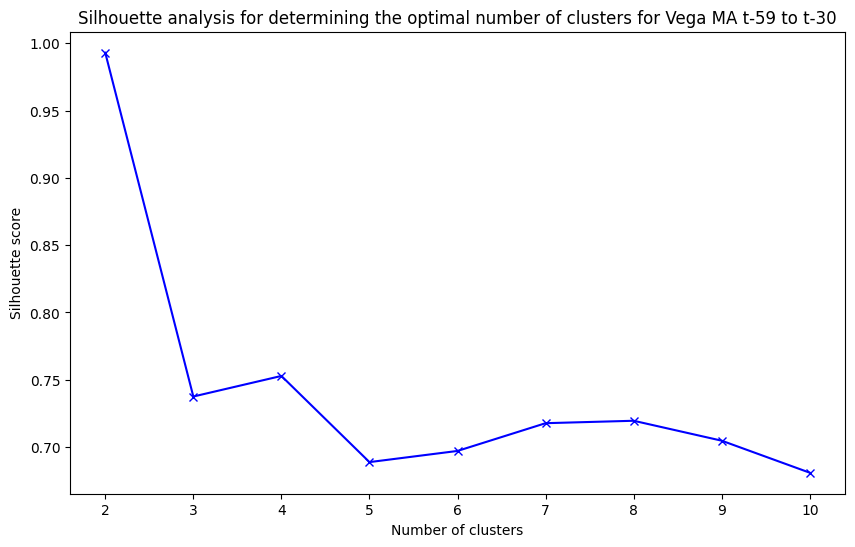

Cluster 1 for Vega MA t-59 to t-30:
Min: -1916.3782669333334
25th Percentile: -1915.1718636580833
Median: -1913.2147960324999
75th Percentile: -1911.782296272
Max: -1911.1883524076668


Cluster 2 for Vega MA t-59 to t-30:
Min: -5.3036583158620685
25th Percentile: 1.9357493849642857
Median: 11.2158280445
75th Percentile: 24.717102236916666
Max: 36.440334714


Optimal number of clusters for Vega MA t-29 to t-15: 2


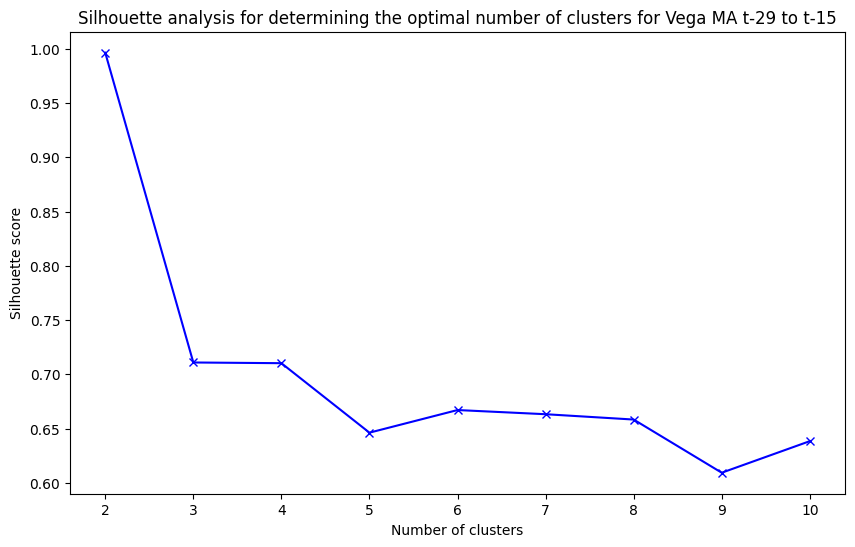

Cluster 1 for Vega MA t-29 to t-15:
Min: -8.756741747142858
25th Percentile: 2.1194664348690475
Median: 7.824676195666667
75th Percentile: 21.30047352133333
Max: 40.42786387066666


Cluster 2 for Vega MA t-29 to t-15:
Min: -3834.372025419333
25th Percentile: -3833.6537881966665
Median: -3832.3884282546665
75th Percentile: -3830.0962877096663
Max: -3828.8900248886666


Optimal number of clusters for Vega MA t-14 to t-10: 2


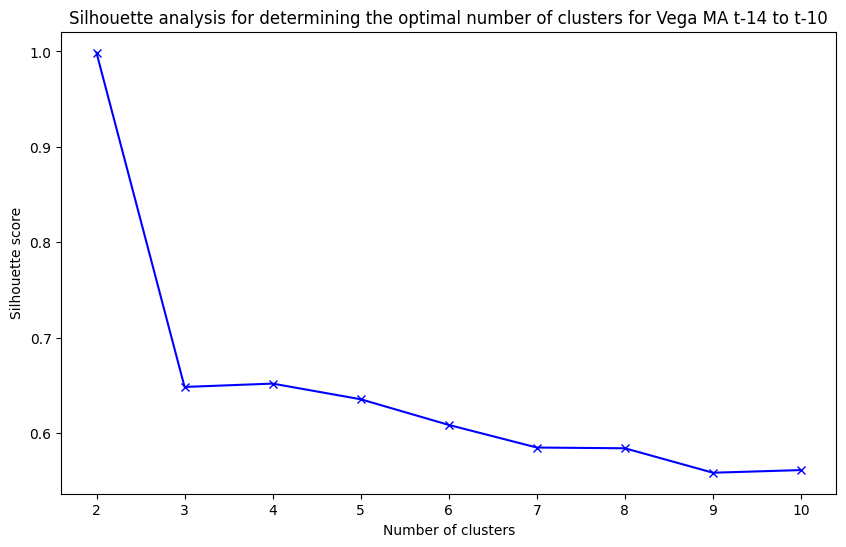

Cluster 1 for Vega MA t-14 to t-10:
Min: -11.563781062
25th Percentile: 1.4984127979999986
Median: 8.868623926000001
75th Percentile: 22.495779062
Max: 47.491319074


Cluster 2 for Vega MA t-14 to t-10:
Min: -11505.349523308
25th Percentile: -11502.908120558
Median: -11502.877896294
75th Percentile: -11502.149707084
Max: -11500.288522768


Optimal number of clusters for Vega MA t-9 to t-5: 2


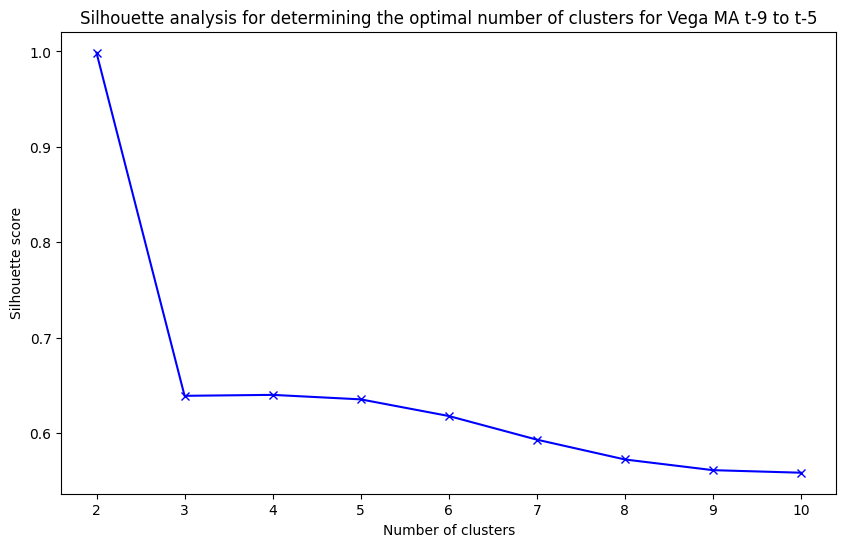

Cluster 1 for Vega MA t-9 to t-5:
Min: -11.563781062
25th Percentile: 1.5618422219999988
Median: 9.141273088999998
75th Percentile: 22.455122065999998
Max: 47.491319074


Cluster 2 for Vega MA t-9 to t-5:
Min: -11505.349523308
25th Percentile: -11502.908120558
Median: -11502.877896294
75th Percentile: -11502.149707084
Max: -11500.288522768


Optimal number of clusters for Vega MA t-4 to t: 2


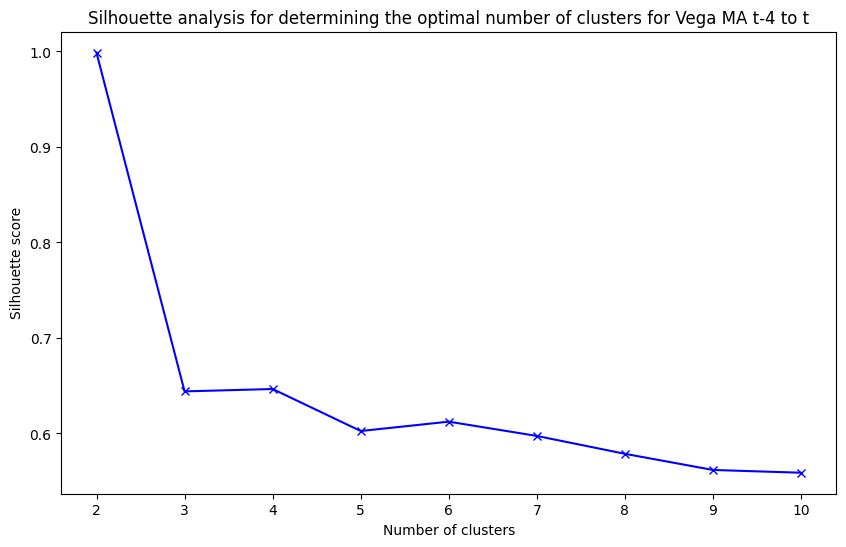

Cluster 1 for Vega MA t-4 to t:
Min: -11.563781062
25th Percentile: 1.565798871999999
Median: 8.868623926000001
75th Percentile: 22.370620256
Max: 47.491319074


Cluster 2 for Vega MA t-4 to t:
Min: -11505.349523308
25th Percentile: -11502.908120558
Median: -11502.877896294
75th Percentile: -11502.149707084
Max: -11500.288522768


Optimal number of clusters for Vega MA t+1 to t+5: 2


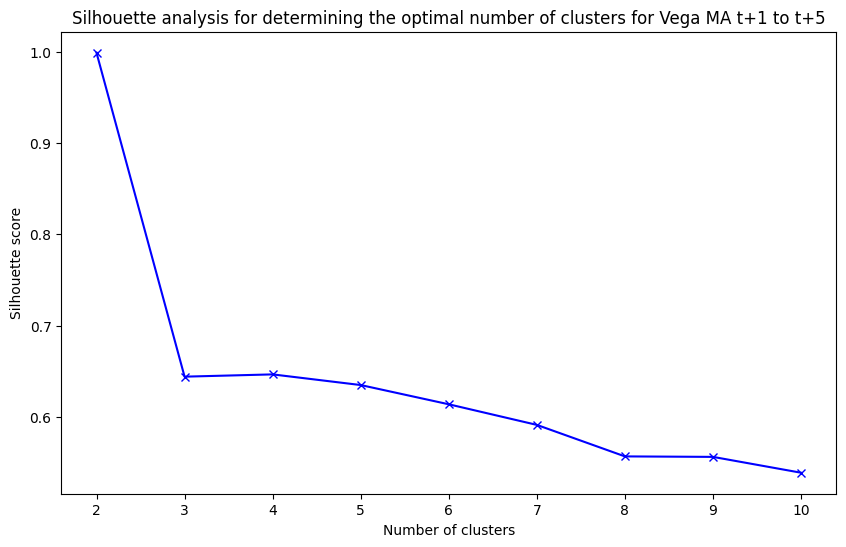

Cluster 1 for Vega MA t+1 to t+5:
Min: -11.563781062
25th Percentile: 1.565798871999999
Median: 8.868623926000001
75th Percentile: 22.370620256
Max: 47.491319074


Cluster 2 for Vega MA t+1 to t+5:
Min: -11505.349523308
25th Percentile: -11502.908120558
Median: -11502.877896294
75th Percentile: -11502.149707084
Max: -11500.288522768




,Date,Swap Rate,Swap Rate MA t-59 to t-30,Swap Rate MA t-29 to t-15,Swap Rate MA t-14 to t-10,Swap Rate MA t-9 to t-5,Swap Rate MA t-4 to t,Swap Rate MA t+1 to t+5,Implied Normal Volatility,Implied Normal Volatility MA t-59 to t-30,Implied Normal Volatility MA t-29 to t-15,Implied Normal Volatility MA t-14 to t-10,Implied Normal Volatility MA t-9 to t-5,Implied Normal Volatility MA t-4 to t,Implied Normal Volatility MA t+1 to t+5,Vega,Vega MA t-59 to t-30,Vega MA t-59 to t-30 Cluster,Vega MA t-59 to t-30 Cluster 1,Vega MA t-59 to t-30 Cluster 2,Vega MA t-29 to t-15,Vega MA t-29 to t-15 Cluster,Vega MA t-29 to t-15 Cluster 1,Vega MA t-29 to t-15 Cluster 2,Vega MA t-14 to t-10,Vega MA t-14 to t-10 Cluster,Vega MA t-14 to t-10 Cluster 1,Vega MA t-14 to t-10 Cluster 2,Vega MA t-9 to t-5,Vega MA t-9 to t-5 Cluster,Vega MA t-9 to t-5 Cluster 1,Vega MA t-9 to t-5 Cluster 2,Vega MA t-4 to t,Vega MA t-4 to t Cluster,Vega MA t-4 to t Cluster 1,Vega MA t-4 to t Cluster 2,Vega MA t+1 to t+5,Vega MA t+1 to t+5 Cluster,Vega MA t+1 to t+5 Cluster 1,Vega MA t+1 to t+5 Cluster 2
354,2022-06-14,2.945934,2.253226,2.506672,2.345756,2.513488,2.705984,2.729408,0.072497,0.035084,0.062348,0.064686,0.069135,0.067972,0.069894,NaN,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>
355,2022-06-15,2.859921,2.271485,2.493856,2.374840,2.527626,2.765980,2.688411,0.072817,0.036132,0.062595,0.065629,0.068631,0.069240,0.068829,NaN,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>
356,2022-06-16,2.719031,2.286878,2.481206,2.404828,2.547333,2.796921,2.655753,0.070476,0.037149,0.062849,0.066854,0.067786,0.070227,0.068139,NaN,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>
357,2022-06-17,2.682615,2.307897,2.461157,2.440356,2.572080,2.807445,2.644467,0.069588,0.038211,0.063035,0.067637,0.067305,0.070869,0.067831,NaN,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>
358,2022-06-20,2.619587,2.330623,2.436285,2.493433,2.619221,2.765418,2.657499,0.067884,0.039315,0.063104,0.068681,0.067013,0.070652,0.067760,NaN,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>
359,2022-06-21,2.765887,2.346493,2.419428,2.513488,2.705984,2.729408,2.644853,0.068706,0.040352,0.063257,0.069135,0.067972,0.069894,0.067435,NaN,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>
360,2022-06-22,2.654932,2.360697,2.414822,2.527626,2.765980,2.688411,2.634075,0.067491,0.041358,0.063660,0.068631,0.069240,0.068829,0.067013,NaN,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>
361,2022-06-23,2.555744,2.376389,2.413865,2.547333,2.796921,2.655753,2.623322,0.067024,0.042357,0.064203,0.067786,0.070227,0.068139,0.066194,NaN,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>
362,2022-06-24,2.626183,2.391920,2.419677,2.572080,2.807445,2.644467,2.584406,0.068052,0.043416,0.064613,0.067305,0.070869,0.067831,0.065058,NaN,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>
363,2022-06-27,2.684751,2.412254,2.424218,2.619221,2.765418,2.657499,2.534040,0.067528,0.044498,0.065141,0.067013,0.070652,0.067760,0.064083,NaN,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>


In [ ]:
# Load the DataFrame from the pickle file
loaded_df = pd.read_pickle(os.path.join(df_dir_path, "dummyTrade1_Expiry_3y_Tenor_3y.pkl"))

loaded_df = loaded_df[['Date', 'Swap Rate', 'atm', 'Vega shock 0']]

# Rename the 'Vega shock 0' column
loaded_df.rename(columns={'atm': 'Implied Normal Volatility', 'Vega shock 0': 'Vega'}, inplace=True)

# Identify the first non-NaN index and count non-NaN values
first_non_nan_index = loaded_df['Vega'].first_valid_index()
non_nan_count = loaded_df['Vega'].count()

# Print the first non-NaN index and associated date
first_non_nan_date = loaded_df.loc[first_non_nan_index, 'Date']
print(f"First non-NaN index: {first_non_nan_index}, Date: {first_non_nan_date}")
print(f"Number of non-NaN values: {non_nan_count}")

# Identify the last NaN value's index
last_nan_index = loaded_df['Vega'][loaded_df['Vega'].isna()].index[-1]

# Print the last NaN index and associated date
last_nan_date = loaded_df.loc[last_nan_index, 'Date']
print(f"Last NaN index: {last_nan_index}, Date: {last_nan_date}")
print(f"First non-NaN index: {first_non_nan_index}")
print(f"Number of non-NaN values: {non_nan_count}")

# Function to compute moving averages and perform clustering
def compute_moving_average_and_clustering(df, column, window, shift_value, prefix):
    # Custom rolling mean function to handle partial windows
    df[f'{prefix}'] = df[column].rolling(window=window, min_periods=1).mean().shift(shift_value)

    # Extract non-NaN moving averages
    non_nan_moving_averages = df[f'{prefix}'].dropna().values.reshape(-1, 1)

    # Determine the optimal number of clusters using the silhouette score
    range_n_clusters = range(2, 11)
    silhouette_avg = []

    for num_clusters in range_n_clusters:
        kmeans = KMeans(n_clusters=num_clusters, n_init=10)
        kmeans.fit(non_nan_moving_averages)
        cluster_labels = kmeans.labels_
        silhouette_avg.append(silhouette_score(non_nan_moving_averages, cluster_labels))

    optimal_clusters = range_n_clusters[np.argmax(silhouette_avg)]

    print(f"Optimal number of clusters for {prefix}: {optimal_clusters}")

    # Plot silhouette scores
    plt.figure(figsize=(10, 6))
    plt.plot(range_n_clusters, silhouette_avg, 'bx-')
    plt.xlabel('Number of clusters')
    plt.ylabel('Silhouette score')
    plt.title(f'Silhouette analysis for determining the optimal number of clusters for {prefix}')
    plt.show()

    # Perform clustering with the optimal number of clusters
    kmeans = KMeans(n_clusters=optimal_clusters, n_init=10)
    cluster_labels = kmeans.fit_predict(non_nan_moving_averages)

    # Analyze the distribution of each cluster
    df[f'{prefix} Cluster'] = np.nan
    df.loc[df[f'{prefix}'].notna(), f'{prefix} Cluster'] = cluster_labels + 1
    df[f'{prefix} Cluster'] = df[f'{prefix} Cluster'].astype('Int64')  # Convert to integer with NaN support

    for i in range(1, optimal_clusters + 1):
        cluster_data = df[df[f'{prefix} Cluster'] == i][f'{prefix}']
        print(f"Cluster {i} for {prefix}:")
        print(f"Min: {cluster_data.min()}")
        print(f"25th Percentile: {cluster_data.quantile(0.25)}")
        print(f"Median: {cluster_data.median()}")
        print(f"75th Percentile: {cluster_data.quantile(0.75)}")
        print(f"Max: {cluster_data.max()}")
        print("\n")

    # Categorize moving averages into clusters and create one-hot encoded columns
    def one_hot_encode_cluster(x, cluster_num):
        if pd.isna(x):
            return np.nan
        return 1 if x == cluster_num else 0

    for i in range(1, optimal_clusters + 1):
        df[f'{prefix} Cluster {i}'] = df[f'{prefix} Cluster'].apply(lambda x: one_hot_encode_cluster(x, i)).astype('Int64')

    # Ensure that cluster columns are NaN if the moving average is NaN
    for i in range(1, optimal_clusters + 1):
        df[f'{prefix} Cluster {i}'] = df.apply(lambda row: np.nan if pd.isna(row[f'{prefix}']) else row[f'{prefix} Cluster {i}'], axis=1).astype('Int64')

# Define the windows
windows = {
    't-59 to t-30': (59, 30),
    't-29 to t-15': (29, 15),
    't-14 to t-10': (14, 10),
    't-9 to t-5': (9, 5),
    't-4 to t': (4, 0),
    't+1 to t+5': (-1, -5)  # Include the original window for completeness
}

# Apply the function to each window
for label, (start, end) in windows.items():
    compute_moving_average_and_clustering(loaded_df, 'Vega', start - end + 1, end, f'Vega MA {label}')

# Compute moving averages for Swap Rate and Implied Normal Volatility
for label, (start, end) in windows.items():
    loaded_df[f'Swap Rate MA {label}'] = loaded_df['Swap Rate'].rolling(window=start - end + 1, min_periods=1).mean().shift(end)
    loaded_df[f'Implied Normal Volatility MA {label}'] = loaded_df['Implied Normal Volatility'].rolling(window=start - end + 1, min_periods=1).mean().shift(end)

# Rearrange columns
swap_rate_cols = [f'Swap Rate MA {label}' for label in windows.keys()]
implied_vol_cols = [f'Implied Normal Volatility MA {label}' for label in windows.keys()]

cluster_cols = []
for label in windows.keys():
    prefix = f'Vega MA {label}'
    cluster_cols.extend([prefix, f'{prefix} Cluster'] + [f'{prefix} Cluster {i}' for i in range(1, optimal_clusters + 1)])

new_order = (
    ['Date', 'Swap Rate'] + swap_rate_cols +
    ['Implied Normal Volatility'] + implied_vol_cols +
    ['Vega'] + cluster_cols
)

loaded_df = loaded_df[new_order]

# Ensure that all columns are displayed
pd.set_option('display.max_columns', None)

# Display the resulting DataFrame
loaded_df.tail(400)

### Force it to have 3 clusters

In [ ]:
n_clusters = 3 # Select n_clusters here

# Load the DataFrame from the pickle file
loaded_df = pd.read_pickle(os.path.join(df_dir_path, "dummyTrade1_Expiry_3y_Tenor_3y.pkl"))

loaded_df = loaded_df[['Date', 'Swap Rate', 'atm', 'Vega shock 0']]

# Rename the 'Vega shock 0' column
loaded_df.rename(columns={'atm': 'Implied Normal Volatility', 'Vega shock 0': 'Vega'}, inplace=True)

# Identify the first non-NaN index and count non-NaN values
first_non_nan_index = loaded_df['Vega'].first_valid_index()
non_nan_count = loaded_df['Vega'].count()

# Print the first non-NaN index and associated date
first_non_nan_date = loaded_df.loc[first_non_nan_index, 'Date']
print(f"First non-NaN index: {first_non_nan_index}, Date: {first_non_nan_date}")
print(f"Number of non-NaN values: {non_nan_count}")

# Identify the last NaN value's index
last_nan_index = loaded_df['Vega'][loaded_df['Vega'].isna()].index[-1]

# Print the last NaN index and associated date
last_nan_date = loaded_df.loc[last_nan_index, 'Date']
print(f"Last NaN index: {last_nan_index}, Date: {last_nan_date}")
print(f"First non-NaN index: {first_non_nan_index}")
print(f"Number of non-NaN values: {non_nan_count}")

print("\n\n=============\n\n")

# Function to compute moving averages and perform clustering
def compute_moving_average_and_clustering(df, column, window, shift_value, prefix):
    # Custom rolling mean function to handle partial windows
    df[f'{prefix}'] = df[column].rolling(window=window, min_periods=1).mean().shift(shift_value)

    # Extract non-NaN moving averages
    non_nan_moving_averages = df[f'{prefix}'].dropna().values.reshape(-1, 1)

    # Perform clustering with 4 clusters
    kmeans = KMeans(n_clusters=n_clusters, n_init=10)
    cluster_labels = kmeans.fit_predict(non_nan_moving_averages)

    # Analyze the distribution of each cluster
    df[f'{prefix} Cluster'] = np.nan
    df.loc[df[f'{prefix}'].notna(), f'{prefix} Cluster'] = cluster_labels + 1

    # Calculate the medians of each cluster
    cluster_medians = df.loc[df[f'{prefix} Cluster'].notna(), [f'{prefix}', f'{prefix} Cluster']].groupby(f'{prefix} Cluster').median().abs()

    # Sort clusters by the absolute value of the median
    sorted_clusters = cluster_medians[f'{prefix}'].sort_values().index.tolist()

    # Remap cluster labels based on sorted order
    cluster_mapping = {old: new for new, old in enumerate(sorted_clusters, start=1)}
    df[f'{prefix} Cluster'] = df[f'{prefix} Cluster'].map(cluster_mapping)

    df[f'{prefix} Cluster'] = df[f'{prefix} Cluster'].astype('Int64')  # Convert to integer with NaN support

    for i in range(1, n_clusters + 1):
        cluster_data = df[df[f'{prefix} Cluster'] == i][f'{prefix}']
        print(f"Cluster {i} for {prefix}:")
        print(f"Min: {cluster_data.min()}")
        print(f"25th Percentile: {cluster_data.quantile(0.25)}")
        print(f"Median: {cluster_data.median()}")
        print(f"75th Percentile: {cluster_data.quantile(0.75)}")
        print(f"Max: {cluster_data.max()}")
        print("\n")

    # Categorize moving averages into clusters and create one-hot encoded columns
    def one_hot_encode_cluster(x, cluster_num):
        if pd.isna(x):
            return np.nan
        return 1 if x == cluster_num else 0

    for i in range(1, n_clusters + 1):
        df[f'{prefix} Cluster {i}'] = df[f'{prefix} Cluster'].apply(lambda x: one_hot_encode_cluster(x, i)).astype('Int64')

    # Ensure that cluster columns are NaN if the moving average is NaN
    for i in range(1, n_clusters + 1):
        df[f'{prefix} Cluster {i}'] = df.apply(lambda row: np.nan if pd.isna(row[f'{prefix}']) else row[f'{prefix} Cluster {i}'], axis=1).astype('Int64')

# Define the windows
windows = {
    't-59 to t-30': (59, 30),
    't-29 to t-15': (29, 15),
    't-14 to t-10': (14, 10),
    't-9 to t-5': (9, 5),
    't-4 to t': (4, 0),
    't+1 to t+5': (-1, -5)  # Include the original window for completeness
}

# Apply the function to each window
for label, (start, end) in windows.items():
    compute_moving_average_and_clustering(loaded_df, 'Vega', start - end + 1, end, f'Vega MA {label}')

# Compute moving averages for Swap Rate and Implied Normal Volatility
for label, (start, end) in windows.items():
    loaded_df[f'Swap Rate MA {label}'] = loaded_df['Swap Rate'].rolling(window=start - end + 1, min_periods=1).mean().shift(end)
    loaded_df[f'Implied Normal Volatility MA {label}'] = loaded_df['Implied Normal Volatility'].rolling(window=start - end + 1, min_periods=1).mean().shift(end)

# Rearrange columns
swap_rate_cols = [f'Swap Rate MA {label}' for label in windows.keys()]
implied_vol_cols = [f'Implied Normal Volatility MA {label}' for label in windows.keys()]

cluster_cols = []
for label in windows.keys():
    prefix = f'Vega MA {label}'
    cluster_cols.extend([prefix, f'{prefix} Cluster'] + [f'{prefix} Cluster {i}' for i in range(1, n_clusters+1)])

new_order = (
    ['Date', 'Swap Rate'] + swap_rate_cols +
    ['Implied Normal Volatility'] + implied_vol_cols +
    ['Vega'] + cluster_cols
)

loaded_df = loaded_df[new_order]

# Ensure that all columns are displayed
pd.set_option('display.max_columns', None)

# Display the resulting DataFrame
loaded_df.tail(400)

First non-NaN index: 410, Date: 2022-09-02
Number of non-NaN values: 336
Last NaN index: 495, Date: 2023-01-02
First non-NaN index: 410
Number of non-NaN values: 336




Cluster 1 for Vega MA t-59 to t-30:
Min: -5.3036583158620685
25th Percentile: 0.31169512428571433
Median: 2.0236067352173914
75th Percentile: 3.98324664
Max: 13.556042893666666


Cluster 2 for Vega MA t-59 to t-30:
Min: 14.119696817333333
25th Percentile: 18.695613197166665
Median: 25.143494918
75th Percentile: 33.33246235083334
Max: 36.440334714


Cluster 3 for Vega MA t-59 to t-30:
Min: -1916.3782669333334
25th Percentile: -1915.1718636580833
Median: -1913.2147960324999
75th Percentile: -1911.782296272
Max: -1911.1883524076668


Cluster 1 for Vega MA t-29 to t-15:
Min: -8.756741747142858
25th Percentile: 0.7595657078571428
Median: 2.3775313884615383
75th Percentile: 4.939268852307692
Max: 14.759339555999999


Cluster 2 for Vega MA t-29 to t-15:
Min: 15.216412457333332
25th Percentile: 20.225978042
Median: 28.34263201

,Date,Swap Rate,Swap Rate MA t-59 to t-30,Swap Rate MA t-29 to t-15,Swap Rate MA t-14 to t-10,Swap Rate MA t-9 to t-5,Swap Rate MA t-4 to t,Swap Rate MA t+1 to t+5,Implied Normal Volatility,Implied Normal Volatility MA t-59 to t-30,Implied Normal Volatility MA t-29 to t-15,Implied Normal Volatility MA t-14 to t-10,Implied Normal Volatility MA t-9 to t-5,Implied Normal Volatility MA t-4 to t,Implied Normal Volatility MA t+1 to t+5,Vega,Vega MA t-59 to t-30,Vega MA t-59 to t-30 Cluster,Vega MA t-59 to t-30 Cluster 1,Vega MA t-59 to t-30 Cluster 2,Vega MA t-59 to t-30 Cluster 3,Vega MA t-29 to t-15,Vega MA t-29 to t-15 Cluster,Vega MA t-29 to t-15 Cluster 1,Vega MA t-29 to t-15 Cluster 2,Vega MA t-29 to t-15 Cluster 3,Vega MA t-14 to t-10,Vega MA t-14 to t-10 Cluster,Vega MA t-14 to t-10 Cluster 1,Vega MA t-14 to t-10 Cluster 2,Vega MA t-14 to t-10 Cluster 3,Vega MA t-9 to t-5,Vega MA t-9 to t-5 Cluster,Vega MA t-9 to t-5 Cluster 1,Vega MA t-9 to t-5 Cluster 2,Vega MA t-9 to t-5 Cluster 3,Vega MA t-4 to t,Vega MA t-4 to t Cluster,Vega MA t-4 to t Cluster 1,Vega MA t-4 to t Cluster 2,Vega MA t-4 to t Cluster 3,Vega MA t+1 to t+5,Vega MA t+1 to t+5 Cluster,Vega MA t+1 to t+5 Cluster 1,Vega MA t+1 to t+5 Cluster 2,Vega MA t+1 to t+5 Cluster 3
354,2022-06-14,2.945934,2.253226,2.506672,2.345756,2.513488,2.705984,2.729408,0.072497,0.035084,0.062348,0.064686,0.069135,0.067972,0.069894,NaN,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>
355,2022-06-15,2.859921,2.271485,2.493856,2.374840,2.527626,2.765980,2.688411,0.072817,0.036132,0.062595,0.065629,0.068631,0.069240,0.068829,NaN,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>
356,2022-06-16,2.719031,2.286878,2.481206,2.404828,2.547333,2.796921,2.655753,0.070476,0.037149,0.062849,0.066854,0.067786,0.070227,0.068139,NaN,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>
357,2022-06-17,2.682615,2.307897,2.461157,2.440356,2.572080,2.807445,2.644467,0.069588,0.038211,0.063035,0.067637,0.067305,0.070869,0.067831,NaN,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>
358,2022-06-20,2.619587,2.330623,2.436285,2.493433,2.619221,2.765418,2.657499,0.067884,0.039315,0.063104,0.068681,0.067013,0.070652,0.067760,NaN,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>
359,2022-06-21,2.765887,2.346493,2.419428,2.513488,2.705984,2.729408,2.644853,0.068706,0.040352,0.063257,0.069135,0.067972,0.069894,0.067435,NaN,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>
360,2022-06-22,2.654932,2.360697,2.414822,2.527626,2.765980,2.688411,2.634075,0.067491,0.041358,0.063660,0.068631,0.069240,0.068829,0.067013,NaN,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>
361,2022-06-23,2.555744,2.376389,2.413865,2.547333,2.796921,2.655753,2.623322,0.067024,0.042357,0.064203,0.067786,0.070227,0.068139,0.066194,NaN,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>
362,2022-06-24,2.626183,2.391920,2.419677,2.572080,2.807445,2.644467,2.584406,0.068052,0.043416,0.064613,0.067305,0.070869,0.067831,0.065058,NaN,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>
363,2022-06-27,2.684751,2.412254,2.424218,2.619221,2.765418,2.657499,2.534040,0.067528,0.044498,0.065141,0.067013,0.070652,0.067760,0.064083,N

## XGBoost: One-hot classification (Don't include this in slides)

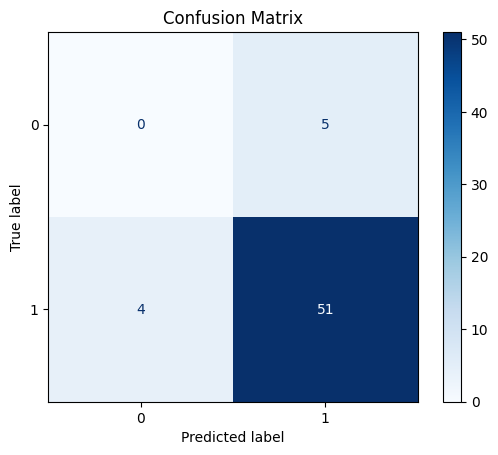

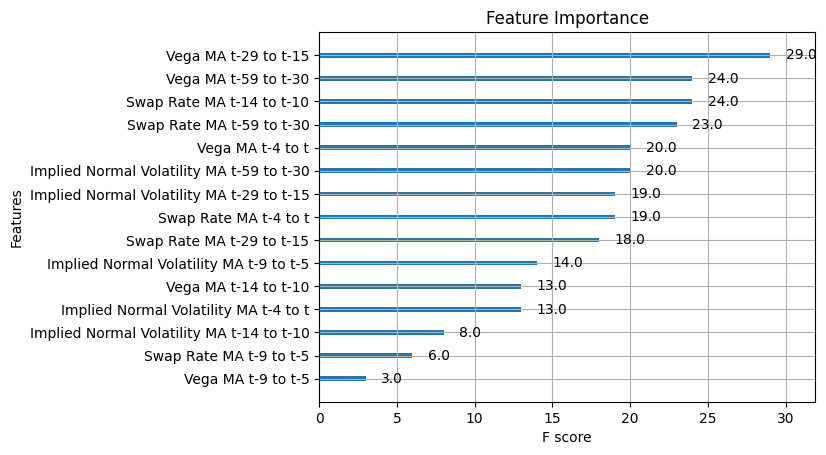

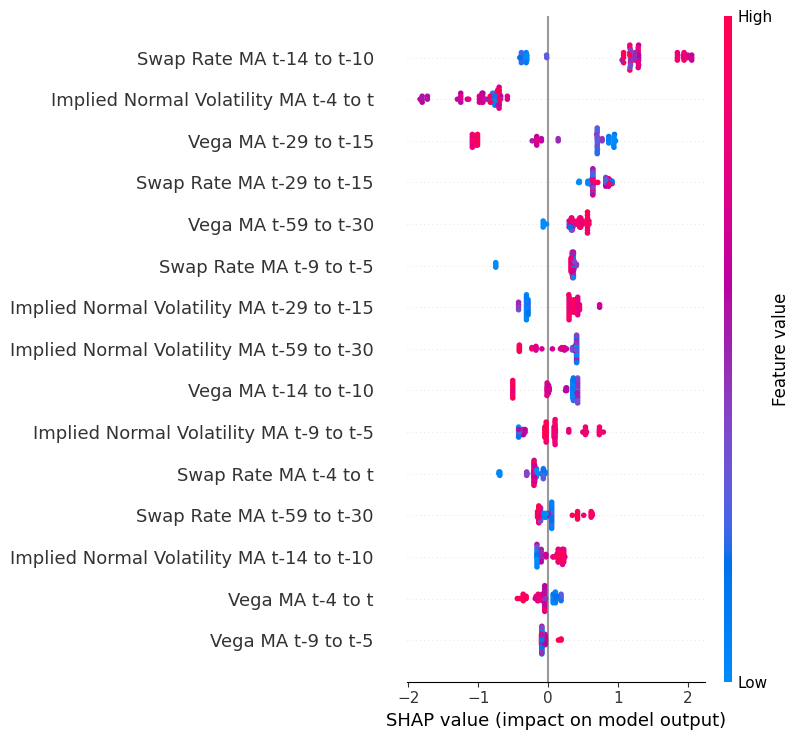

In [ ]:
# Select X variables and Y variable
continuous_vars = [
    'Swap Rate MA t-59 to t-30', 'Swap Rate MA t-29 to t-15', 'Swap Rate MA t-14 to t-10',
    'Swap Rate MA t-9 to t-5', 'Swap Rate MA t-4 to t',
    'Implied Normal Volatility MA t-59 to t-30', 'Implied Normal Volatility MA t-29 to t-15',
    'Implied Normal Volatility MA t-14 to t-10', 'Implied Normal Volatility MA t-9 to t-5',
    'Implied Normal Volatility MA t-4 to t',
    'Vega MA t-59 to t-30', 'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10',
    'Vega MA t-9 to t-5', 'Vega MA t-4 to t'
]

X_vars = continuous_vars
Y_var = 'Vega MA t+1 to t+5 Cluster 1'

# Drop rows where the Y variable is NaN
df = loaded_df.dropna(subset=[Y_var])

# Separate the last 60 non-NaN Y values for testing
test_data = df.iloc[-60:]
train_data = df.iloc[:-60]

X_train = train_data[X_vars]
y_train = train_data[Y_var]
X_test = test_data[X_vars]
y_test = test_data[Y_var]

# Train XGBoost model
model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Compute and visualize the confusion matrix
cm = confusion_matrix(y_test, y_pred, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

# Feature importance
xgb.plot_importance(model, importance_type='weight')
plt.title('Feature Importance')
plt.show()

# Visualize the quantitative impact of each X variable on the Y variable
explainer = shap.Explainer(model)
shap_values = explainer(X_test)

# Summary plot
shap.summary_plot(shap_values, X_test)

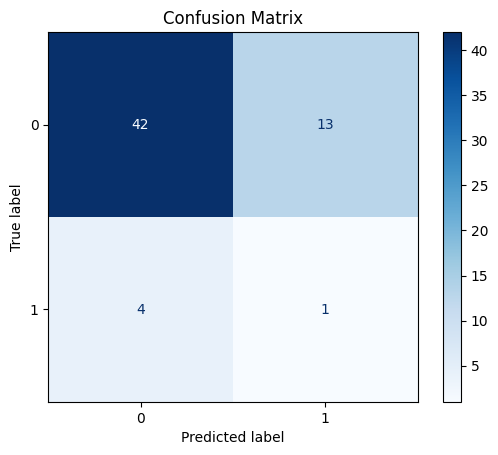

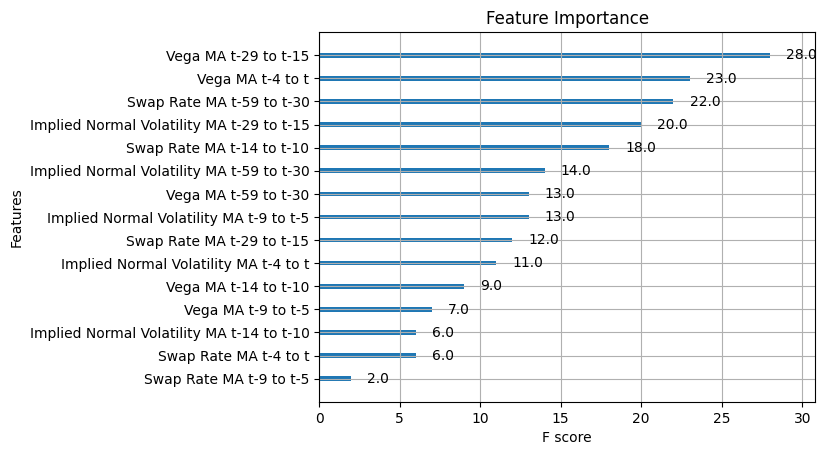

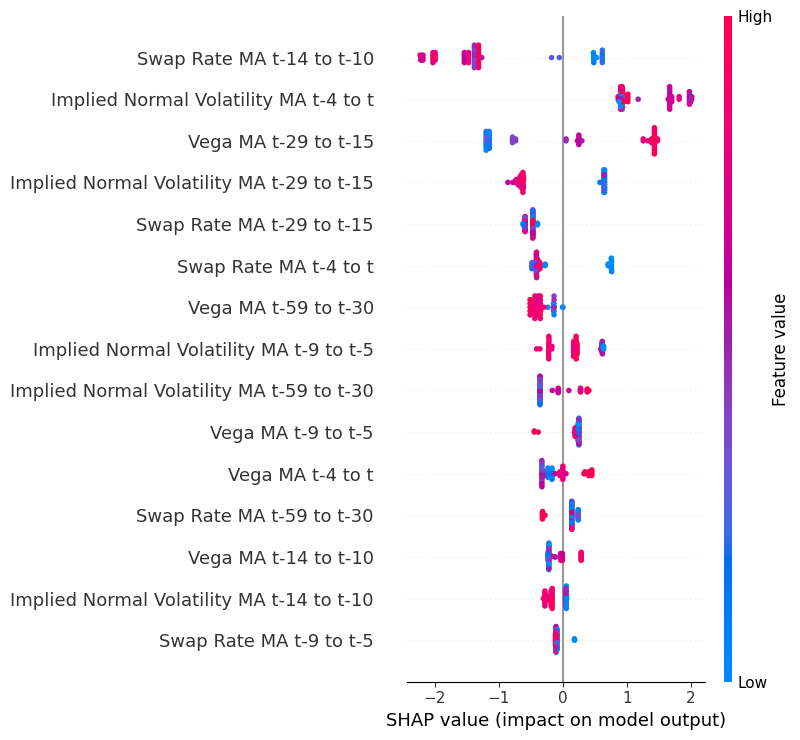

In [ ]:
# Select X variables and Y variable
continuous_vars = [
    'Swap Rate MA t-59 to t-30', 'Swap Rate MA t-29 to t-15', 'Swap Rate MA t-14 to t-10',
    'Swap Rate MA t-9 to t-5', 'Swap Rate MA t-4 to t',
    'Implied Normal Volatility MA t-59 to t-30', 'Implied Normal Volatility MA t-29 to t-15',
    'Implied Normal Volatility MA t-14 to t-10', 'Implied Normal Volatility MA t-9 to t-5',
    'Implied Normal Volatility MA t-4 to t',
    'Vega MA t-59 to t-30', 'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10',
    'Vega MA t-9 to t-5', 'Vega MA t-4 to t'
]

X_vars = continuous_vars
Y_var = 'Vega MA t+1 to t+5 Cluster 2'

# Drop rows where the Y variable is NaN
df = loaded_df.dropna(subset=[Y_var])

# Separate the last 60 non-NaN Y values for testing
test_data = df.iloc[-60:]
train_data = df.iloc[:-60]

X_train = train_data[X_vars]
y_train = train_data[Y_var]
X_test = test_data[X_vars]
y_test = test_data[Y_var]

# Train XGBoost model
model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Compute and visualize the confusion matrix
cm = confusion_matrix(y_test, y_pred, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

# Feature importance
xgb.plot_importance(model, importance_type='weight')
plt.title('Feature Importance')
plt.show()

# Visualize the quantitative impact of each X variable on the Y variable
explainer = shap.Explainer(model)
shap_values = explainer(X_test)

# Summary plot
shap.summary_plot(shap_values, X_test)

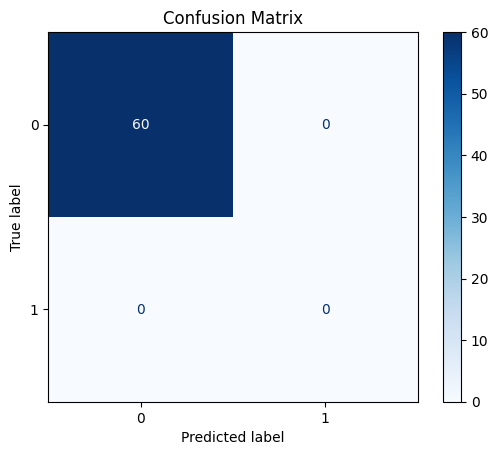

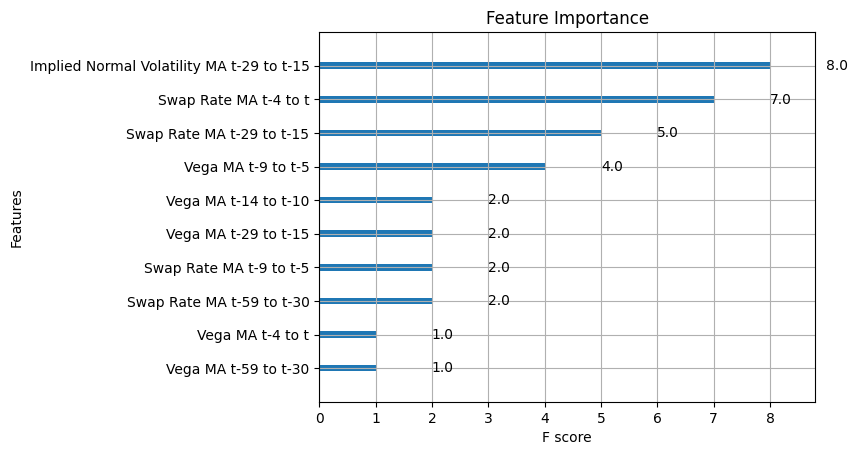

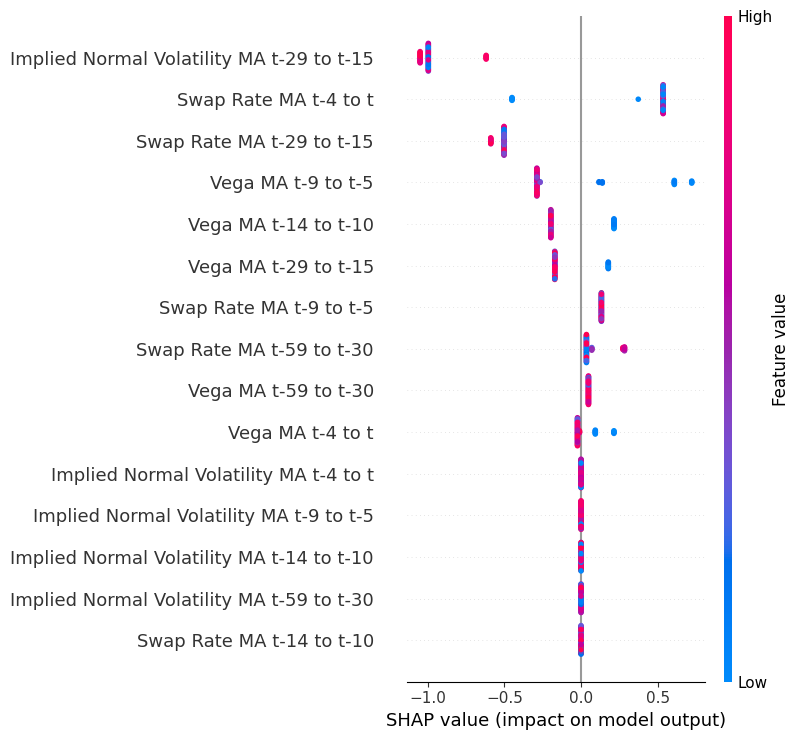

In [ ]:
# Select X variables and Y variable
continuous_vars = [
    'Swap Rate MA t-59 to t-30', 'Swap Rate MA t-29 to t-15', 'Swap Rate MA t-14 to t-10',
    'Swap Rate MA t-9 to t-5', 'Swap Rate MA t-4 to t',
    'Implied Normal Volatility MA t-59 to t-30', 'Implied Normal Volatility MA t-29 to t-15',
    'Implied Normal Volatility MA t-14 to t-10', 'Implied Normal Volatility MA t-9 to t-5',
    'Implied Normal Volatility MA t-4 to t',
    'Vega MA t-59 to t-30', 'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10',
    'Vega MA t-9 to t-5', 'Vega MA t-4 to t'
]

X_vars = continuous_vars
Y_var = 'Vega MA t+1 to t+5 Cluster 3'

# Drop rows where the Y variable is NaN
df = loaded_df.dropna(subset=[Y_var])

# Separate the last 60 non-NaN Y values for testing
test_data = df.iloc[-60:]
train_data = df.iloc[:-60]

X_train = train_data[X_vars]
y_train = train_data[Y_var]
X_test = test_data[X_vars]
y_test = test_data[Y_var]

# Train XGBoost model
model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Compute and visualize the confusion matrix
cm = confusion_matrix(y_test, y_pred, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

# Feature importance
xgb.plot_importance(model, importance_type='weight')
plt.title('Feature Importance')
plt.show()

# Visualize the quantitative impact of each X variable on the Y variable
explainer = shap.Explainer(model)
shap_values = explainer(X_test)

# Summary plot
shap.summary_plot(shap_values, X_test)

## XGBoost: Multi-class classification

Explanationn:

In predicting which category 'Vega MA t+1 to t+5' will fall into: 'low risk' (class 1), 'high risk' (class 2), and 'extreme high risk' (class 3), we use XGBoost to do classification.

Note that there are 331 'Vega MA t+1 to t+5' data in total. The first 271 are training data. The last 60 data are testing data. Testing is crucial in all machine learning tasks. In quantitative finacne, the process of choosing the most recent 2-3 months of data frame to do model testing is called "backtesting". Backtesting is one of the cornerstones in quantitative finance 建模 processes. **Please please please mention that we use the last 60 data to do backtesting in our ppt slides.**

The confusion matrix shows how well our XGBoost model performs during back-testing. Please search "confusion matrix" on wikipedia to understand what is "True Negative" "True Positive" "False Negative" "False Positive". Concept could be a bit confusing. But try to understand. Alternatively, you can copy and paste the confusion matrix photo onto ChatGPT and let ChatGPT do the confusion matrix analysis for you.

https://en.wikipedia.org/wiki/Confusion_matrix#:~:text=In%20predictive%20analytics%2C%20a%20table,false%20positives%2C%20and%20true%20negatives.


I also got feature analysis and SHAP value analysis diagram for you. Take note that there are 3 diagrams for the SHAP value analysis.

- The 1st diagram explains the impact of X variables (features) on classifying 'Vega MA t+1 to t+5' as class 1 (low risk).
- The 2nd diagram explains the impact of X variables (features) on classifying 'Vega MA t+1 to t+5' as class 2 (high risk).
- The 3rd diagram explains the impact of X variables (features) on classifying 'Vega MA t+1 to t+5' as class 3 (extreme high risk).

As mentioned, throw the diagrams (feature analysis and SHAP value analysis diagram) to ChatGPT and let ChatGPT do the confusion matrix analysis for you.

Also, use Case 1 and ignore Case 2. Slides don't need to explain and don't need to mention the difference between these two cases. So you can ignore the words below.

======================================

X variables with continuous and one-hot variables VS all continuous variables

**Case 1: X variables consist of continuous and one-hot variables**

Remember that our 'Vega MA t+1 to t+5' to be influenced by the following factors:

- 'Swap Rate MA t-59 to t-30', 'Swap Rate MA t-29 to t-15', 'Swap Rate MA t-14 to t-10','Swap Rate MA t-9 to t-5', 'Swap Rate MA t-4 to t',
- 'Implied Normal Volatility MA t-59 to t-30', 'Implied Normal Volatility MA t-29 to t-15', 'Implied Normal Volatility MA t-14 to t-10', 'Implied Normal Volatility MA t-9 to t-5','Implied Normal Volatility MA t-4 to t',
- 'Vega MA t-59 to t-30', 'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10', 'Vega MA t-9 to t-5', 'Vega MA t-4 to t'

For 'Vega MA t-59 to t-30', ..., 'Vega MA t-4 to t', essentially they are vega data. So similar to the above, we can use kNN to classify them into 3 classes: low risk' (class 1), 'high risk' (class 2), and 'extreme high risk' (class 3).

Now if we classify all 'Vega MA t-59 to t-30' data into class 1, 2, 3, we will create 3 more one-hot data columns:

- 'Vega MA t-59 to t-30 Cluster 1', which takes value of 1 if 'Vega MA t-59 to t-30' is 1, and takes value of 0 if 'Vega MA t-59 to t-30' is 2 or 3
- 'Vega MA t-59 to t-30 Cluster 2', which takes value of 1 if 'Vega MA t-59 to t-30' is 2, and takes value of 0 if 'Vega MA t-59 to t-30' is 1 or 3
- 'Vega MA t-59 to t-30 Cluster 3', which takes value of 1 if 'Vega MA t-59 to t-30' is 3, and takes value of 0 if 'Vega MA t-59 to t-30' is 1 or 2

Similarly, we have columns 'Vega MA t-29 to t-15 Cluster 1', 'Vega MA t-29 to t-15 Cluster 2', 'Vega MA t-29 to t-15 Cluster 3', ..., 'Vega MA t-4 to t Cluster 1', 'Vega MA t-4 to t Cluster 2', 'Vega MA t-4 to t Cluster 3'.

**Case 2: X variables consist of continuous variables only**

We don't do kNN clustering for X variables 'Vega MA t-59 to t-30', 'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10', 'Vega MA t-9 to t-5', 'Vega MA t-4 to t'. Instead, we keep them as continuous value data (means the data can take any real number value).

**Case 1 performs better than Case 2**

### Case 1: X variables consist of continuous and one-hot variables (Use case 1)

<ipython-input-12-e60c430d43b8>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[Y_var] = df[Y_var] - 1


Accuracy: 0.88


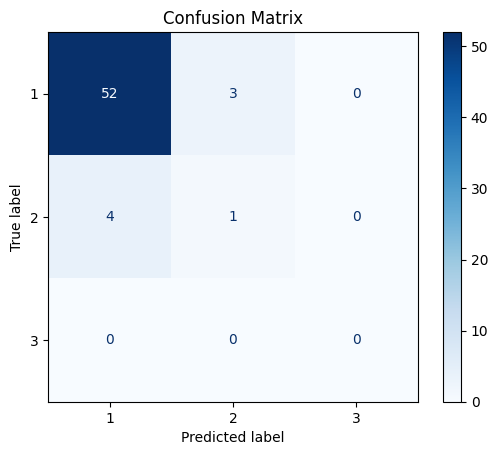

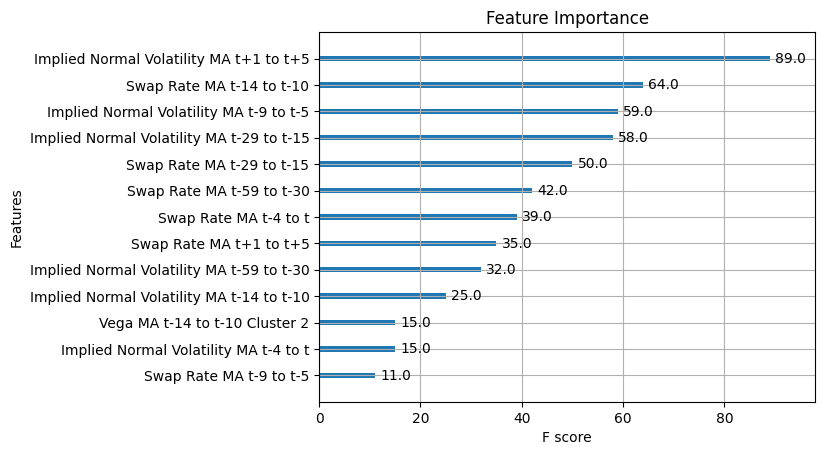

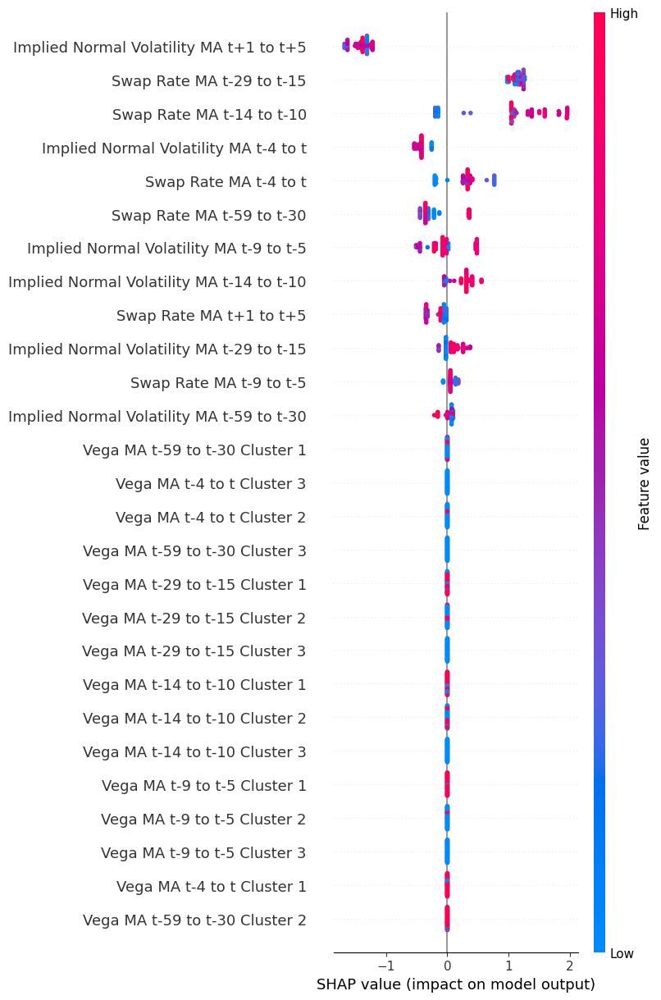

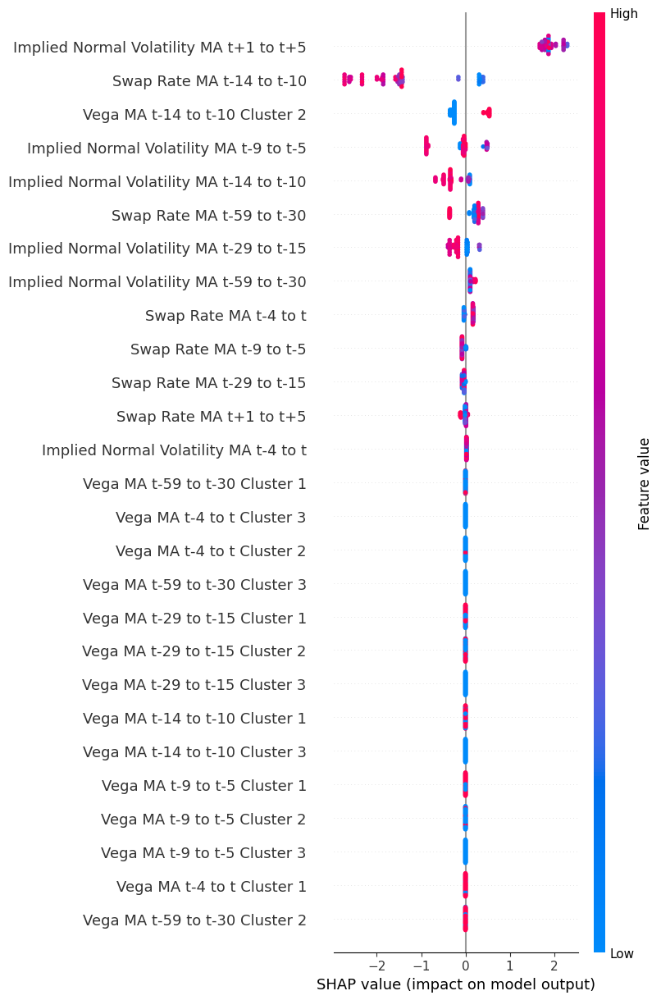

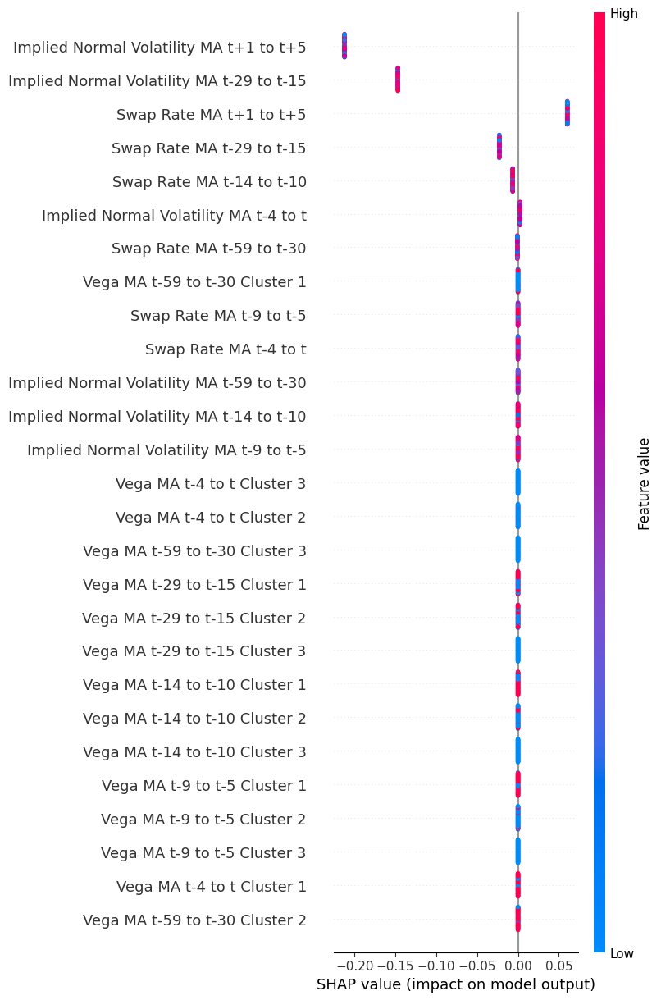

In [ ]:
# Select X variables and Y variable
continuous_vars = [
    'Swap Rate MA t-59 to t-30', 'Swap Rate MA t-29 to t-15', 'Swap Rate MA t-14 to t-10',
    'Swap Rate MA t-9 to t-5', 'Swap Rate MA t-4 to t', 'Swap Rate MA t+1 to t+5',
    'Implied Normal Volatility MA t-59 to t-30', 'Implied Normal Volatility MA t-29 to t-15',
    'Implied Normal Volatility MA t-14 to t-10', 'Implied Normal Volatility MA t-9 to t-5',
    'Implied Normal Volatility MA t-4 to t', 'Implied Normal Volatility MA t+1 to t+5'
]

one_hot_vars = [
    'Vega MA t-59 to t-30 Cluster 1', 'Vega MA t-59 to t-30 Cluster 2', 'Vega MA t-59 to t-30 Cluster 3',
    'Vega MA t-29 to t-15 Cluster 1', 'Vega MA t-29 to t-15 Cluster 2', 'Vega MA t-29 to t-15 Cluster 3',
    'Vega MA t-14 to t-10 Cluster 1', 'Vega MA t-14 to t-10 Cluster 2', 'Vega MA t-14 to t-10 Cluster 3',
    'Vega MA t-9 to t-5 Cluster 1', 'Vega MA t-9 to t-5 Cluster 2', 'Vega MA t-9 to t-5 Cluster 3',
    'Vega MA t-4 to t Cluster 1', 'Vega MA t-4 to t Cluster 2', 'Vega MA t-4 to t Cluster 3',
]

X_vars = continuous_vars + one_hot_vars
Y_var = 'Vega MA t+1 to t+5 Cluster'

# Drop rows where the Y variable is NaN
df = loaded_df.dropna(subset=[Y_var])

# Adjust the Y variable to start from 0
df[Y_var] = df[Y_var] - 1

# Separate the last 60 non-NaN Y values for testing
test_data = df.iloc[-60:]
train_data = df.iloc[:-60]

X_train = train_data[X_vars].astype(float)
y_train = train_data[Y_var]
X_test = test_data[X_vars].astype(float)
y_test = test_data[Y_var]

# Train XGBoost model
model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Compute accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Compute and visualize the confusion matrix
cm = confusion_matrix(y_test, y_pred, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[label + 1 for label in model.classes_])
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

# Feature importance
xgb.plot_importance(model, importance_type='weight')
plt.title('Feature Importance')
plt.show()

# Visualize the quantitative impact of each X variable on the Y variable
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# # Verify SHAP values shape and feature names
# print(f'SHAP values shape: {shap_values.shape}')
# print(f'Feature names: {X_test.columns}')

# Summary plot for each class
num_features = len(X_test.columns)

for class_idx in range(shap_values.shape[2]):
    shap.summary_plot(shap_values[:,:,class_idx], X_test, feature_names=X_test.columns.tolist(), max_display=num_features)

### Case 2: X variables consist of continuous variables only (Ignore case 2)

<ipython-input-13-e1473574c044>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[Y_var] = df[Y_var] - 1


Accuracy: 0.78


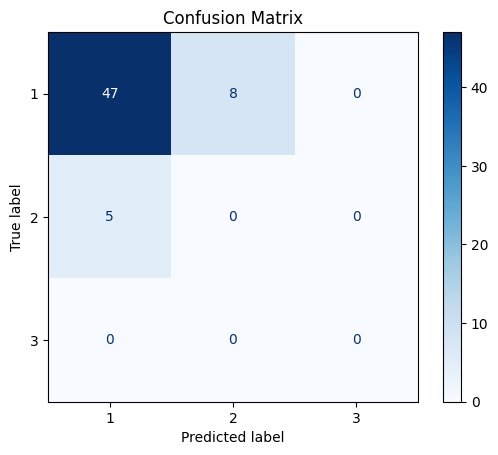

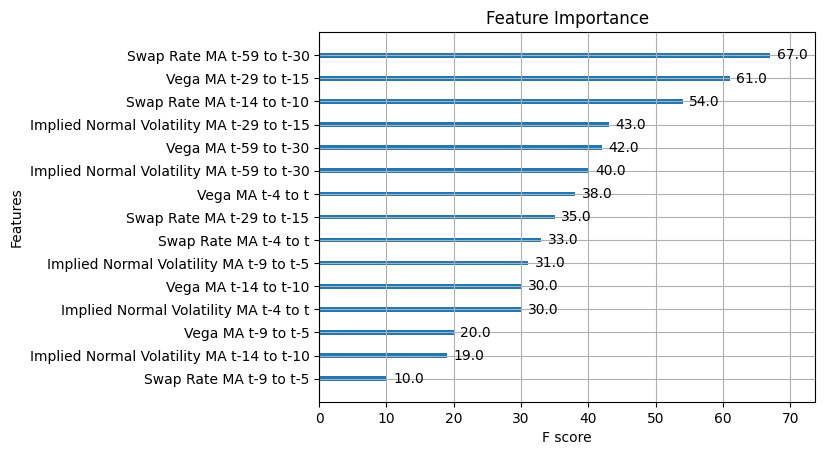

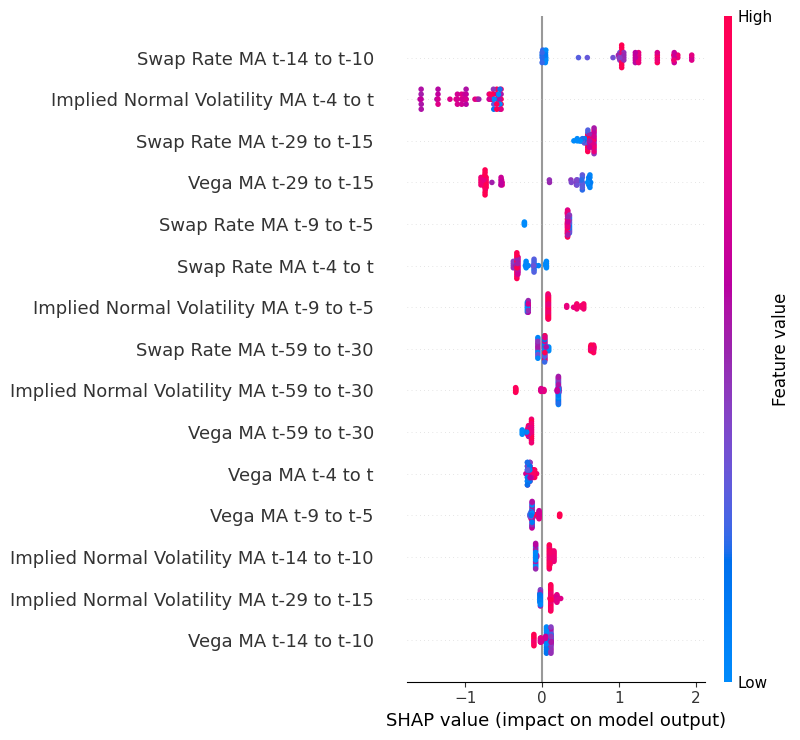

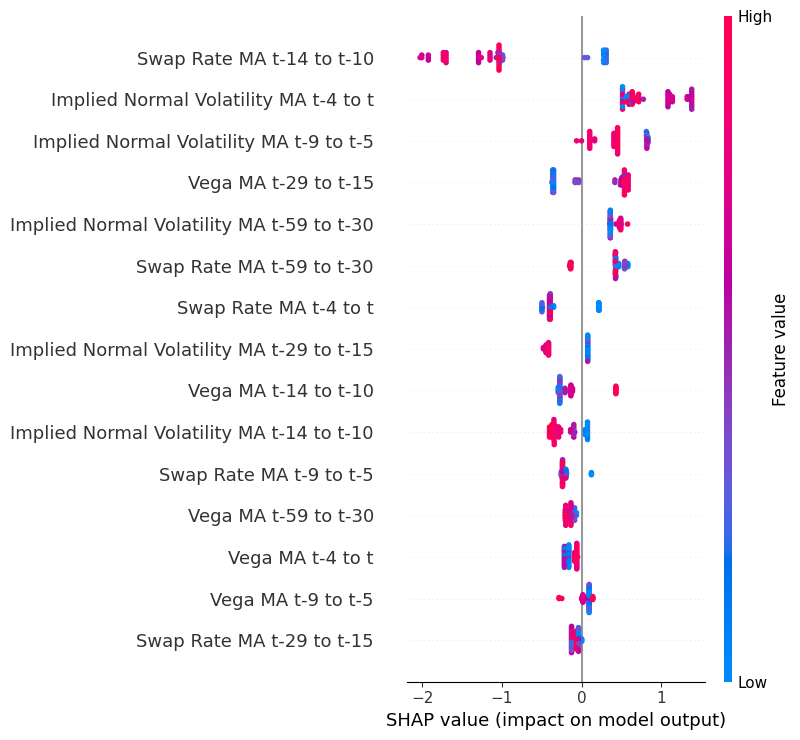

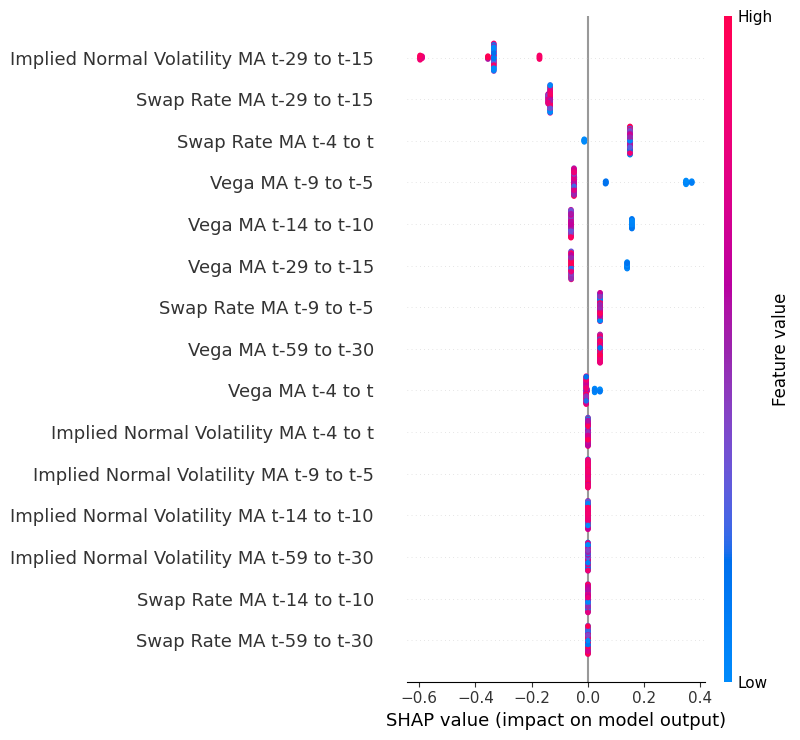

In [ ]:
# Select X variables and Y variable
continuous_vars = [
    'Swap Rate MA t-59 to t-30', 'Swap Rate MA t-29 to t-15', 'Swap Rate MA t-14 to t-10',
    'Swap Rate MA t-9 to t-5', 'Swap Rate MA t-4 to t',
    'Implied Normal Volatility MA t-59 to t-30', 'Implied Normal Volatility MA t-29 to t-15',
    'Implied Normal Volatility MA t-14 to t-10', 'Implied Normal Volatility MA t-9 to t-5',
    'Implied Normal Volatility MA t-4 to t',
    'Vega MA t-59 to t-30', 'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10',
    'Vega MA t-9 to t-5', 'Vega MA t-4 to t'
]

X_vars = continuous_vars
Y_var = 'Vega MA t+1 to t+5 Cluster'

# Drop rows where the Y variable is NaN
df = loaded_df.dropna(subset=[Y_var])

# Adjust the Y variable to start from 0
df[Y_var] = df[Y_var] - 1

# Separate the last 60 non-NaN Y values for testing
test_data = df.iloc[-60:]
train_data = df.iloc[:-60]

X_train = train_data[X_vars].astype(float)
y_train = train_data[Y_var]
X_test = test_data[X_vars].astype(float)
y_test = test_data[Y_var]

# Train XGBoost model
model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Compute accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Compute and visualize the confusion matrix
cm = confusion_matrix(y_test, y_pred, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[label + 1 for label in model.classes_])
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

# Feature importance
xgb.plot_importance(model, importance_type='weight')
plt.title('Feature Importance')
plt.show()

# Visualize the quantitative impact of each X variable on the Y variable
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# # Verify SHAP values shape and feature names
# print(f'SHAP values shape: {shap_values.shape}')
# print(f'Feature names: {X_test.columns}')

# Summary plot for each class
num_features = len(X_test.columns)

for class_idx in range(shap_values.shape[2]):
    shap.summary_plot(shap_values[:,:,class_idx], X_test, feature_names=X_test.columns.tolist(), max_display=num_features)

## XGBoost: Prediction

Explanation:

Here, instead of classifying the Y variable 'Vega MA t+1 to t+5' into 3 categories, we keep it as a real number. We use XGBoost to do **prediction** of a real value, **not classification**.

Same as before, the first 271 data are used for model training, the latest 60 data are for **backtesting**.

We don't do confusion matrix. Instead, we compute Mean Squared Error and Mean Absolute Error.

All X-variables remain as real number, not classified into cluster 1, 2, 3.

I also got feature analysis and SHAP value analysis diagram for you. Only 1 SHAP value diagram instead of 3, because we don't classify the Y variable 'Vega MA t+1 to t+5'.

I also got a plot of actual versus predicted Y value for you.

The two subsections

- Plot 1 for "Actual vs Predicted Vega MA t+1 to t+5"
- Plot 2 for "Actual vs Predicted Vega MA t+1 to t+5"

Only differ in terms of how the "Actual vs Predicted Vega MA t+1 to t+5" diagram looks. In your slides, decide which diagram looks better, and show that diagram.

The analysis should mention that, because 'Vega MA t+1 to t+5' in the backtesting period doesn't fall in the 'extreme high risk' category, i.e. its trend is stable, hence the prediction goes well. (If 'Vega MA t+1 to t+5' is 'extreme high risk', then nwe wouldn't be able to predict a precise value.)

### Plot 1 for "Actual vs Predicted Vega MA t+1 to t+5"

689    2023-10-16
690    2023-10-17
691    2023-10-18
692    2023-10-19
693    2023-10-20
694    2023-10-23
695    2023-10-24
696    2023-10-25
697    2023-10-26
698    2023-10-27
699    2023-10-30
700    2023-10-31
701    2023-11-01
702    2023-11-02
703    2023-11-03
704    2023-11-06
705    2023-11-07
706    2023-11-08
707    2023-11-09
708    2023-11-10
709    2023-11-13
710    2023-11-14
711    2023-11-15
712    2023-11-16
713    2023-11-17
714    2023-11-20
715    2023-11-21
716    2023-11-22
717    2023-11-23
718    2023-11-24
719    2023-11-27
720    2023-11-28
721    2023-11-29
722    2023-11-30
723    2023-12-01
724    2023-12-04
725    2023-12-05
726    2023-12-06
727    2023-12-07
728    2023-12-08
729    2023-12-11
730    2023-12-12
731    2023-12-13
732    2023-12-14
733    2023-12-15
734    2023-12-18
735    2023-12-19
736    2023-12-20
737    2023-12-21
738    2023-12-22
739    2023-12-25
740    2023-12-26
741    2023-12-27
742    2023-12-28
743    2023-12-29
744    202

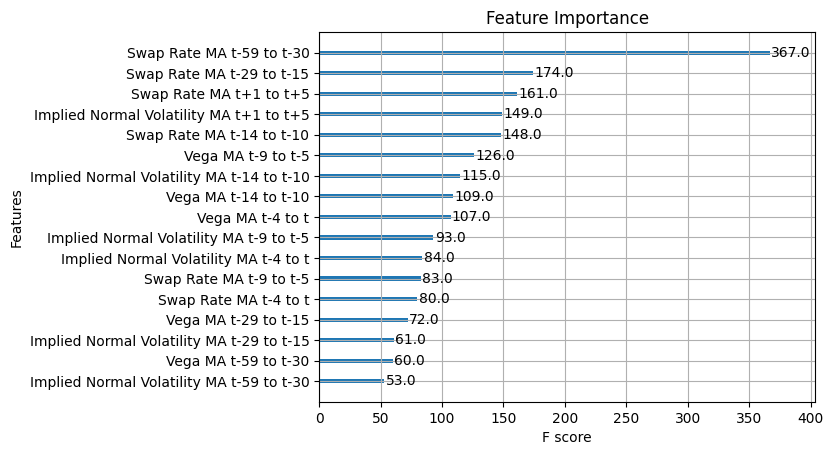

SHAP values shape: (60, 17)
Feature names: Index(['Swap Rate MA t-59 to t-30', 'Swap Rate MA t-29 to t-15',
       'Swap Rate MA t-14 to t-10', 'Swap Rate MA t-9 to t-5',
       'Swap Rate MA t-4 to t', 'Swap Rate MA t+1 to t+5',
       'Implied Normal Volatility MA t-59 to t-30',
       'Implied Normal Volatility MA t-29 to t-15',
       'Implied Normal Volatility MA t-14 to t-10',
       'Implied Normal Volatility MA t-9 to t-5',
       'Implied Normal Volatility MA t-4 to t',
       'Implied Normal Volatility MA t+1 to t+5', 'Vega MA t-59 to t-30',
       'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10', 'Vega MA t-9 to t-5',
       'Vega MA t-4 to t'],
      dtype='object')


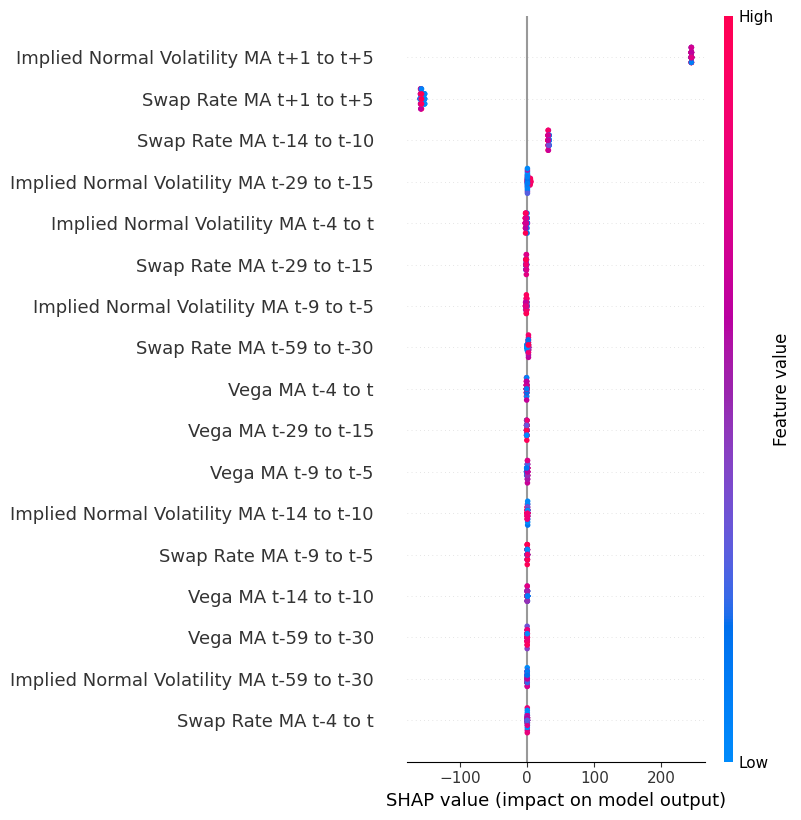

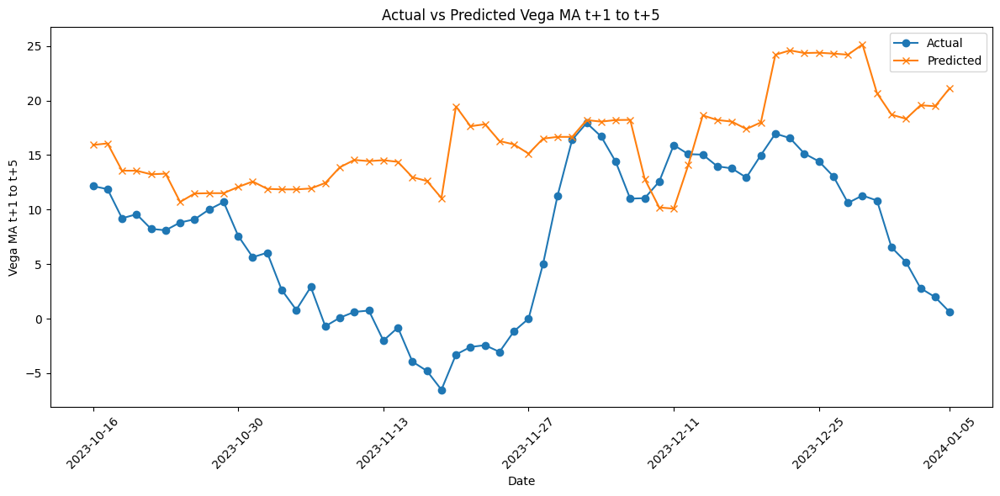

In [ ]:
# Select X variables and Y variable
continuous_vars = [
    'Swap Rate MA t-59 to t-30', 'Swap Rate MA t-29 to t-15', 'Swap Rate MA t-14 to t-10',
    'Swap Rate MA t-9 to t-5', 'Swap Rate MA t-4 to t', 'Swap Rate MA t+1 to t+5',
    'Implied Normal Volatility MA t-59 to t-30', 'Implied Normal Volatility MA t-29 to t-15',
    'Implied Normal Volatility MA t-14 to t-10', 'Implied Normal Volatility MA t-9 to t-5',
    'Implied Normal Volatility MA t-4 to t', 'Implied Normal Volatility MA t+1 to t+5',
    'Vega MA t-59 to t-30', 'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10',
    'Vega MA t-9 to t-5', 'Vega MA t-4 to t'
]

X_vars = continuous_vars
Y_var = 'Vega MA t+1 to t+5'

# Drop rows where the Y variable is NaN
df = loaded_df.dropna(subset=[Y_var])

# Separate the last 60 non-NaN Y values for testing
test_data = df.iloc[-60:]
train_data = df.iloc[:-60]

X_train = train_data[X_vars].astype(float)
y_train = train_data[Y_var]
X_test = test_data[X_vars].astype(float)
y_test = test_data[Y_var]

# Train XGBoost model
model = xgb.XGBRegressor(eval_metric='rmse')
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# print results
print(test_data['Date'])
print(y_pred)

# Compute and display error metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Squared Error: {mse:.2f}")
print(f"Mean Absolute Error: {mae:.2f}")

# Feature importance
xgb.plot_importance(model, importance_type='weight')
plt.title('Feature Importance')
plt.show()

# Visualize the quantitative impact of each X variable on the Y variable
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Verify SHAP values shape and feature names
print(f'SHAP values shape: {shap_values.shape}')
print(f'Feature names: {X_test.columns}')

# Summary plot
shap.summary_plot(shap_values, X_test, feature_names=X_test.columns.tolist())

# Plot actual vs. predicted values
plt.figure(figsize=(12, 6))
plt.plot(test_data['Date'], y_test, label='Actual', marker='o')
plt.plot(test_data['Date'], y_pred, label='Predicted', marker='x')

# Customize x-ticks to show date for every 10 entries and the last date
date_ticks = test_data['Date'].iloc[::10].tolist()
if test_data['Date'].iloc[-1] not in date_ticks:
    date_ticks.append(test_data['Date'].iloc[-1])
plt.xticks(date_ticks, rotation=45)

plt.xlabel('Date')
plt.ylabel(Y_var)
plt.title(f'Actual vs Predicted {Y_var}')
plt.legend()
plt.tight_layout()
plt.show()

### Plot 2 for "Actual vs Predicted Vega MA t+1 to t+5"

689    2023-10-16
690    2023-10-17
691    2023-10-18
692    2023-10-19
693    2023-10-20
694    2023-10-23
695    2023-10-24
696    2023-10-25
697    2023-10-26
698    2023-10-27
699    2023-10-30
700    2023-10-31
701    2023-11-01
702    2023-11-02
703    2023-11-03
704    2023-11-06
705    2023-11-07
706    2023-11-08
707    2023-11-09
708    2023-11-10
709    2023-11-13
710    2023-11-14
711    2023-11-15
712    2023-11-16
713    2023-11-17
714    2023-11-20
715    2023-11-21
716    2023-11-22
717    2023-11-23
718    2023-11-24
719    2023-11-27
720    2023-11-28
721    2023-11-29
722    2023-11-30
723    2023-12-01
724    2023-12-04
725    2023-12-05
726    2023-12-06
727    2023-12-07
728    2023-12-08
729    2023-12-11
730    2023-12-12
731    2023-12-13
732    2023-12-14
733    2023-12-15
734    2023-12-18
735    2023-12-19
736    2023-12-20
737    2023-12-21
738    2023-12-22
739    2023-12-25
740    2023-12-26
741    2023-12-27
742    2023-12-28
743    2023-12-29
744    202

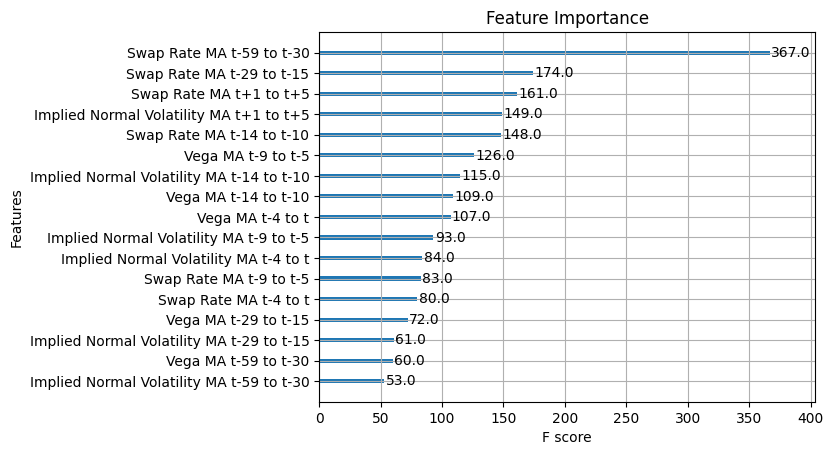

SHAP values shape: (60, 17)
Feature names: Index(['Swap Rate MA t-59 to t-30', 'Swap Rate MA t-29 to t-15',
       'Swap Rate MA t-14 to t-10', 'Swap Rate MA t-9 to t-5',
       'Swap Rate MA t-4 to t', 'Swap Rate MA t+1 to t+5',
       'Implied Normal Volatility MA t-59 to t-30',
       'Implied Normal Volatility MA t-29 to t-15',
       'Implied Normal Volatility MA t-14 to t-10',
       'Implied Normal Volatility MA t-9 to t-5',
       'Implied Normal Volatility MA t-4 to t',
       'Implied Normal Volatility MA t+1 to t+5', 'Vega MA t-59 to t-30',
       'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10', 'Vega MA t-9 to t-5',
       'Vega MA t-4 to t'],
      dtype='object')


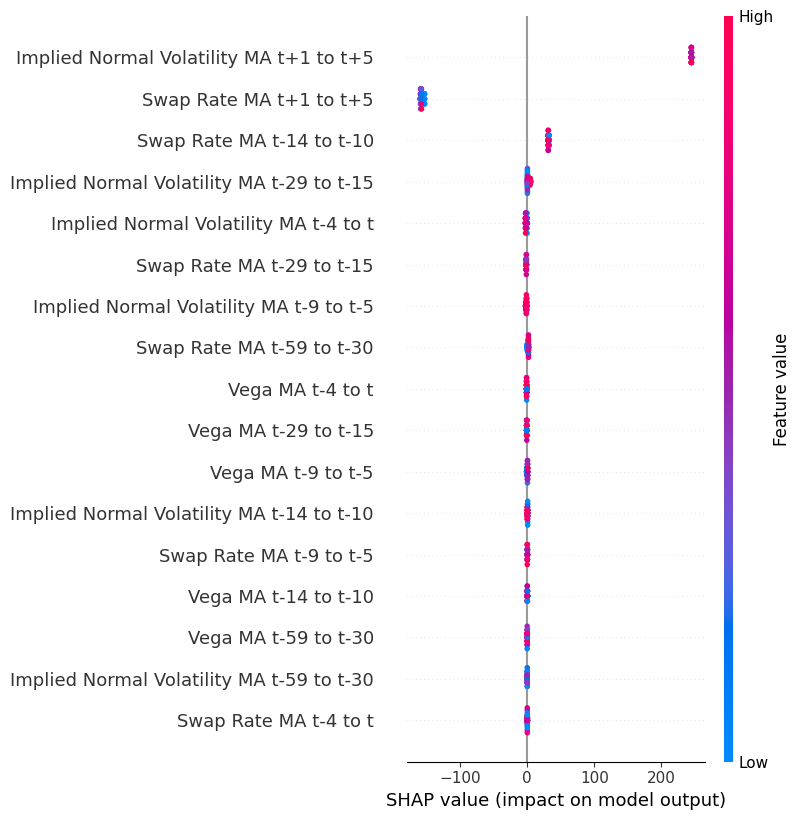

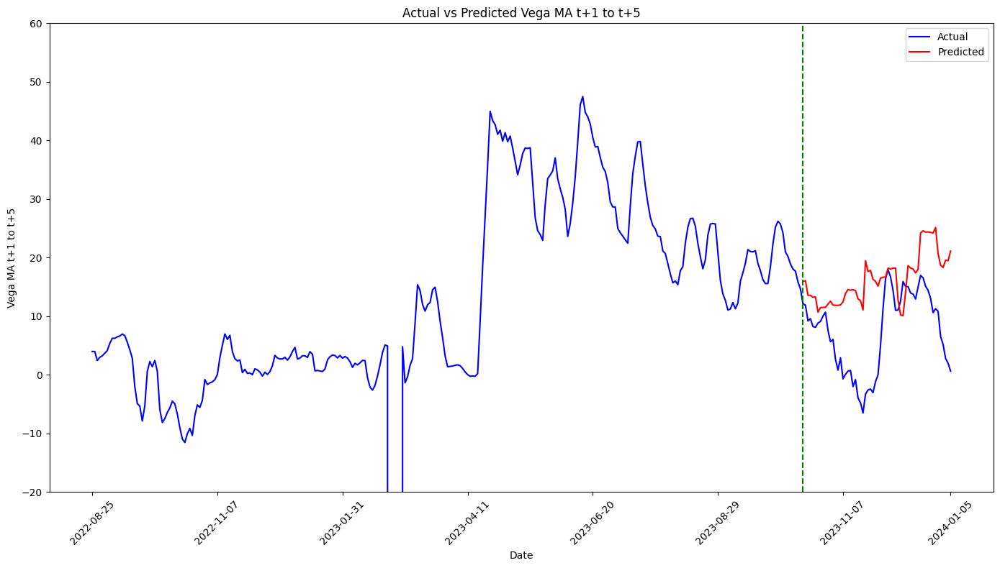

In [ ]:
# Select X variables and Y variable
continuous_vars = [
    'Swap Rate MA t-59 to t-30', 'Swap Rate MA t-29 to t-15', 'Swap Rate MA t-14 to t-10',
    'Swap Rate MA t-9 to t-5', 'Swap Rate MA t-4 to t', 'Swap Rate MA t+1 to t+5',
    'Implied Normal Volatility MA t-59 to t-30', 'Implied Normal Volatility MA t-29 to t-15',
    'Implied Normal Volatility MA t-14 to t-10', 'Implied Normal Volatility MA t-9 to t-5',
    'Implied Normal Volatility MA t-4 to t', 'Implied Normal Volatility MA t+1 to t+5',
    'Vega MA t-59 to t-30', 'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10',
    'Vega MA t-9 to t-5', 'Vega MA t-4 to t'
]

X_vars = continuous_vars
Y_var = 'Vega MA t+1 to t+5'

# Drop rows where the Y variable is NaN
df = loaded_df.dropna(subset=[Y_var])

# Separate the last 60 non-NaN Y values for testing
test_data = df.iloc[-60:]
train_data = df.iloc[:-60]

X_train = train_data[X_vars].astype(float)
y_train = train_data[Y_var]
X_test = test_data[X_vars].astype(float)
y_test = test_data[Y_var]

# Train XGBoost model
model = xgb.XGBRegressor(eval_metric='rmse')
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# print results
print(test_data['Date'])
print(y_pred)

# Compute and display error metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Squared Error: {mse:.2f}")
print(f"Mean Absolute Error: {mae:.2f}")

# Feature importance
xgb.plot_importance(model, importance_type='weight')
plt.title('Feature Importance')
plt.show()

# Visualize the quantitative impact of each X variable on the Y variable
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Verify SHAP values shape and feature names
print(f'SHAP values shape: {shap_values.shape}')
print(f'Feature names: {X_test.columns}')

# Summary plot
shap.summary_plot(shap_values, X_test, feature_names=X_test.columns.tolist())

# Plot actual vs. predicted values
plt.figure(figsize=(14, 8))

# Plot the entire actual Y data
plt.plot(df['Date'], df[Y_var], label='Actual', color='blue')

# Plot the predicted Y data for the test period
plt.plot(test_data['Date'], y_pred, label='Predicted', color='red')

# Customize ylim
plt.ylim(-20, 60)

# Draw vertical line at the last 60th Date
plt.axvline(x=test_data['Date'].iloc[0], color='green', linestyle='--')

# Customize x-ticks to show date for every 50 entries and the last date
date_ticks = df['Date'].iloc[::50].tolist()
if df['Date'].iloc[-1] not in date_ticks:
    date_ticks.append(df['Date'].iloc[-1])
plt.xticks(date_ticks, rotation=45)

plt.xlabel('Date')
plt.ylabel(Y_var)
plt.title(f'Actual vs Predicted {Y_var}')
plt.legend()
plt.tight_layout()
plt.show()

# XGBoost Model Prediction, Product: Expiry 3y Tenor 4y

In your slides, mention that:

- We consider another product because in "Storyline_2_Observation_and_Correlation.ipynb" we find that Vega of Expiry 3y Tenor 3y is negatively correlated with Vega of Expiry 3y Tenor 4y.

- Only show selected graph that you feel you can write an analysis on the comparison. Don't need to show all graph. E.g. don't need to show Silhouette Analysis graph again, don't need to show the range of the 3 risk buckets.

The key comparison should be the results of

- Case of risk buckets: the confusion matrix, the feature analysis and SHAP value analysis diagram

- Case of predicting real value Vega: Mean Squared Error and Mean Absolute Error, the feature analysis and SHAP value analysis diagram

But select only the diagrams where you feel you have something meaningful to write for comparison

## Data Preprocessing

First non-NaN index: 410, Date: 2022-09-02
Number of non-NaN values: 336
Last NaN index: 495, Date: 2023-01-02
First non-NaN index: 410
Number of non-NaN values: 336
Optimal number of clusters for Vega MA t-59 to t-30: 2


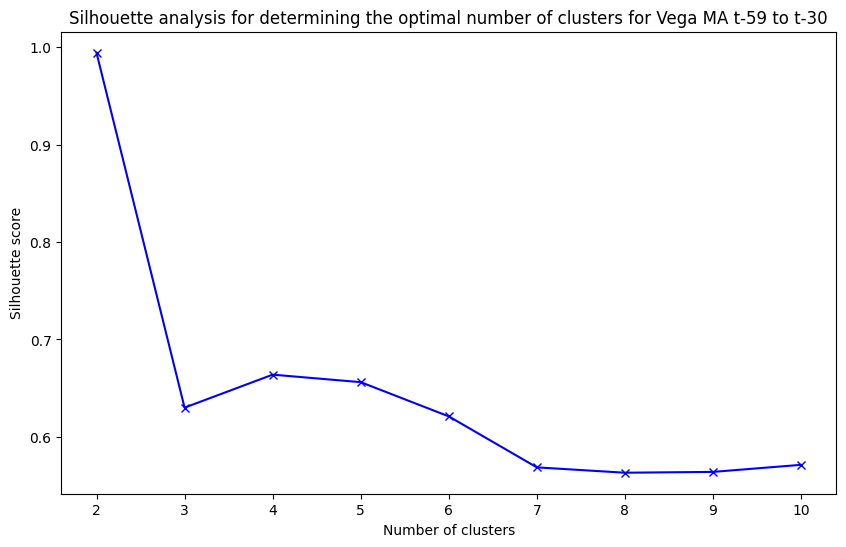

Cluster 1 for Vega MA t-59 to t-30:
Min: -24.981113784137932
25th Percentile: -14.780051436482143
Median: -7.681116398388889
75th Percentile: -4.739041251222222
Max: 8.864655149333334


Cluster 2 for Vega MA t-59 to t-30:
Min: 1574.030578956
25th Percentile: 1576.7240532845835
Median: 1579.3994587625002
75th Percentile: 1585.5287038381668
Max: 1589.1165154900002


Optimal number of clusters for Vega MA t-29 to t-15: 2


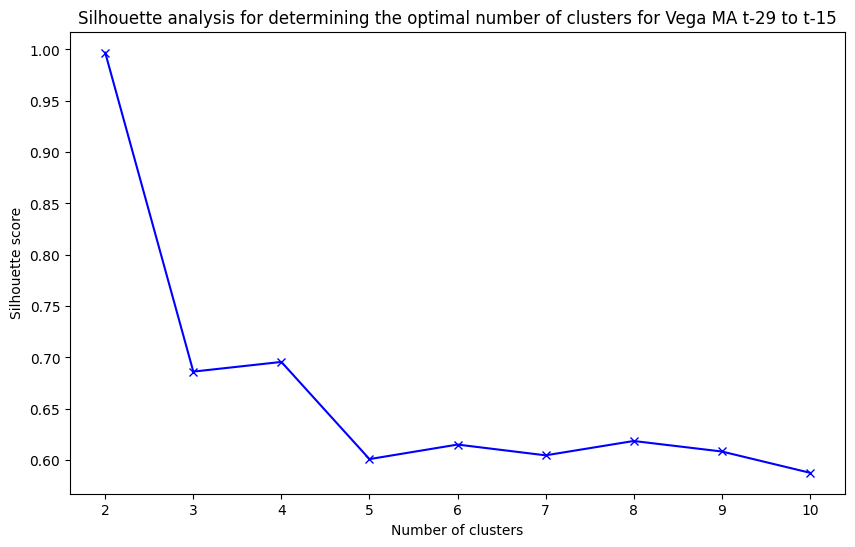

Cluster 1 for Vega MA t-29 to t-15:
Min: 3168.7033455613337
25th Percentile: 3172.8640534983338
Median: 3176.0433754793335
75th Percentile: 3177.488248228667
Max: 3180.755155140667


Cluster 2 for Vega MA t-29 to t-15:
Min: -28.554686614
25th Percentile: -14.858910700000001
Median: -7.097851553
75th Percentile: -3.960539791833333
Max: 13.928505567999999


Optimal number of clusters for Vega MA t-14 to t-10: 2


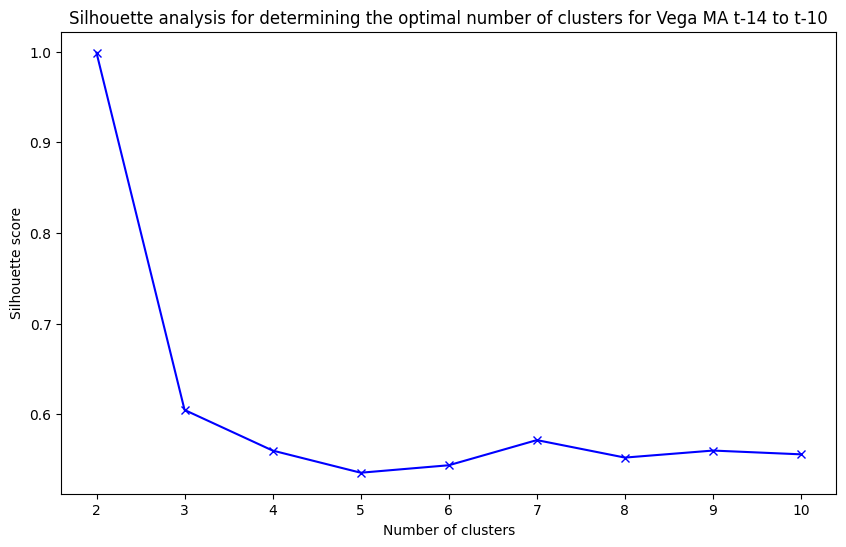

Cluster 1 for Vega MA t-14 to t-10:
Min: -41.163562911999996
25th Percentile: -16.804474862
Median: -7.096743612499999
75th Percentile: -1.646993122
Max: 15.762341893999999


Cluster 2 for Vega MA t-14 to t-10:
Min: 9562.458764042
25th Percentile: 9564.561589298
Median: 9565.123643769999
75th Percentile: 9567.707274878001
Max: 9568.310440616


Optimal number of clusters for Vega MA t-9 to t-5: 2


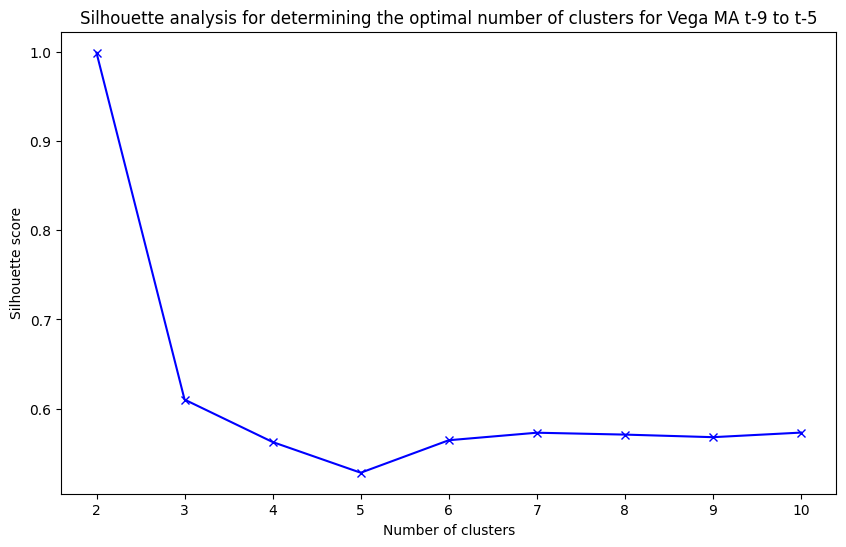

Cluster 1 for Vega MA t-9 to t-5:
Min: -41.163562911999996
25th Percentile: -16.737727023625002
Median: -7.004533753
75th Percentile: -1.3625777695000008
Max: 15.762341893999999


Cluster 2 for Vega MA t-9 to t-5:
Min: 9562.458764042
25th Percentile: 9564.561589298
Median: 9565.123643769999
75th Percentile: 9567.707274878001
Max: 9568.310440616


Optimal number of clusters for Vega MA t-4 to t: 2


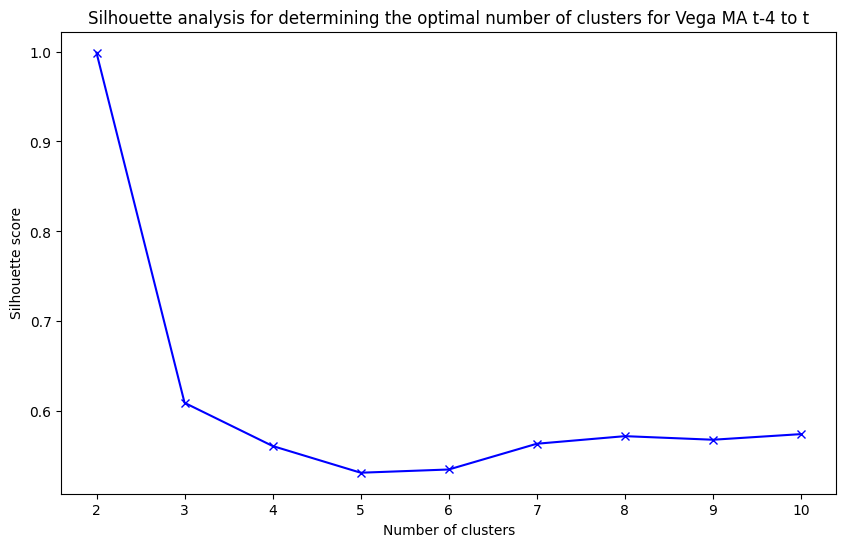

Cluster 1 for Vega MA t-4 to t:
Min: -41.163562911999996
25th Percentile: -16.625423571
Median: -6.957398584000001
75th Percentile: -1.1892968640000003
Max: 15.762341893999999


Cluster 2 for Vega MA t-4 to t:
Min: 9562.458764042
25th Percentile: 9564.561589298
Median: 9565.123643769999
75th Percentile: 9567.707274878001
Max: 9568.310440616


Optimal number of clusters for Vega MA t+1 to t+5: 2


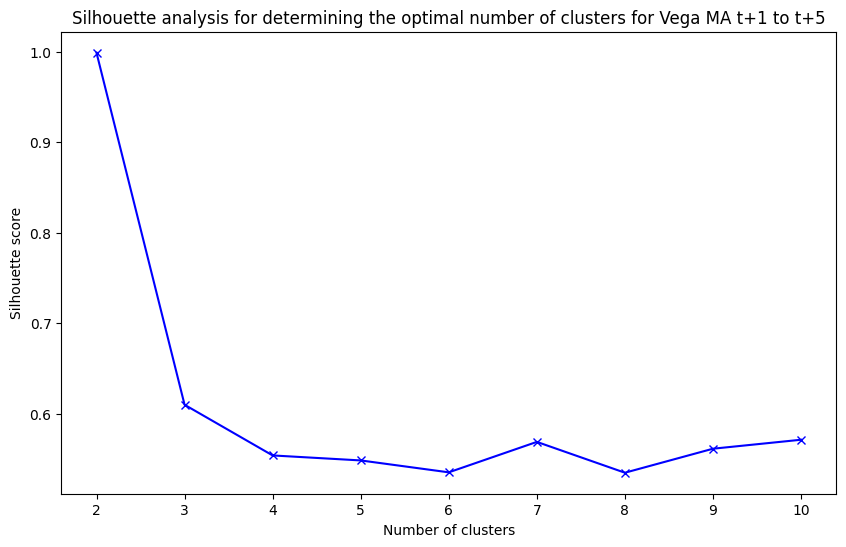

Cluster 1 for Vega MA t+1 to t+5:
Min: -41.163562911999996
25th Percentile: -16.625423571
Median: -6.957398584000001
75th Percentile: -1.1892968640000003
Max: 15.762341893999999


Cluster 2 for Vega MA t+1 to t+5:
Min: 9562.458764042
25th Percentile: 9564.561589298
Median: 9565.123643769999
75th Percentile: 9567.707274878001
Max: 9568.310440616




,Date,Swap Rate,Swap Rate MA t-59 to t-30,Swap Rate MA t-29 to t-15,Swap Rate MA t-14 to t-10,Swap Rate MA t-9 to t-5,Swap Rate MA t-4 to t,Swap Rate MA t+1 to t+5,Implied Normal Volatility,Implied Normal Volatility MA t-59 to t-30,Implied Normal Volatility MA t-29 to t-15,Implied Normal Volatility MA t-14 to t-10,Implied Normal Volatility MA t-9 to t-5,Implied Normal Volatility MA t-4 to t,Implied Normal Volatility MA t+1 to t+5,Vega,Vega MA t-59 to t-30,Vega MA t-59 to t-30 Cluster,Vega MA t-59 to t-30 Cluster 1,Vega MA t-59 to t-30 Cluster 2,Vega MA t-29 to t-15,Vega MA t-29 to t-15 Cluster,Vega MA t-29 to t-15 Cluster 1,Vega MA t-29 to t-15 Cluster 2,Vega MA t-14 to t-10,Vega MA t-14 to t-10 Cluster,Vega MA t-14 to t-10 Cluster 1,Vega MA t-14 to t-10 Cluster 2,Vega MA t-9 to t-5,Vega MA t-9 to t-5 Cluster,Vega MA t-9 to t-5 Cluster 1,Vega MA t-9 to t-5 Cluster 2,Vega MA t-4 to t,Vega MA t-4 to t Cluster,Vega MA t-4 to t Cluster 1,Vega MA t-4 to t Cluster 2,Vega MA t+1 to t+5,Vega MA t+1 to t+5 Cluster,Vega MA t+1 to t+5 Cluster 1,Vega MA t+1 to t+5 Cluster 2
354,2022-06-14,2.936060,2.252732,2.520646,2.360557,2.526788,2.707098,2.735023,0.086148,0.040929,0.075196,0.078020,0.083079,0.081171,0.081922,NaN,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>
355,2022-06-15,2.853619,2.270458,2.508878,2.390240,2.541329,2.763234,2.695573,0.084141,0.042203,0.075482,0.079185,0.082430,0.082031,0.081000,NaN,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>
356,2022-06-16,2.731976,2.285986,2.496945,2.419434,2.559231,2.795257,2.661289,0.082526,0.043457,0.075769,0.080601,0.081394,0.082809,0.080230,NaN,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>
357,2022-06-17,2.685236,2.307402,2.476757,2.455660,2.580753,2.806243,2.650607,0.081735,0.044770,0.075979,0.081471,0.080699,0.083350,0.079933,NaN,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>
358,2022-06-20,2.635789,2.330603,2.451874,2.508318,2.624637,2.768536,2.661028,0.080242,0.046133,0.076081,0.082553,0.080261,0.082958,0.079992,NaN,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>
359,2022-06-21,2.768494,2.347744,2.435251,2.526788,2.707098,2.735023,2.648443,0.080968,0.047448,0.076227,0.083079,0.081171,0.081922,0.079775,NaN,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>
360,2022-06-22,2.656370,2.362999,2.429948,2.541329,2.763234,2.695573,2.638162,0.079532,0.048732,0.076641,0.082430,0.082031,0.081000,0.079654,NaN,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>
361,2022-06-23,2.560555,2.379297,2.428602,2.559231,2.795257,2.661289,2.627863,0.078676,0.050005,0.077202,0.081394,0.082809,0.080230,0.079183,NaN,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>
362,2022-06-24,2.631825,2.395351,2.434254,2.580753,2.806243,2.650607,2.591269,0.080249,0.051342,0.077611,0.080699,0.083350,0.079933,0.078367,NaN,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>
363,2022-06-27,2.687898,2.416309,2.438349,2.624637,2.768536,2.661028,2.543683,0.080534,0.052698,0.078155,0.080261,0.082958,0.079992,0.077572,NaN,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>


In [ ]:
# Load the DataFrame from the pickle file
loaded_df = pd.read_pickle(os.path.join(df_dir_path, "dummyTrade1_Expiry_3y_Tenor_4y.pkl"))

loaded_df = loaded_df[['Date', 'Swap Rate', 'atm', 'Vega shock 0']]

# Rename the 'Vega shock 0' column
loaded_df.rename(columns={'atm': 'Implied Normal Volatility', 'Vega shock 0': 'Vega'}, inplace=True)

# Identify the first non-NaN index and count non-NaN values
first_non_nan_index = loaded_df['Vega'].first_valid_index()
non_nan_count = loaded_df['Vega'].count()

# Print the first non-NaN index and associated date
first_non_nan_date = loaded_df.loc[first_non_nan_index, 'Date']
print(f"First non-NaN index: {first_non_nan_index}, Date: {first_non_nan_date}")
print(f"Number of non-NaN values: {non_nan_count}")

# Identify the last NaN value's index
last_nan_index = loaded_df['Vega'][loaded_df['Vega'].isna()].index[-1]

# Print the last NaN index and associated date
last_nan_date = loaded_df.loc[last_nan_index, 'Date']
print(f"Last NaN index: {last_nan_index}, Date: {last_nan_date}")
print(f"First non-NaN index: {first_non_nan_index}")
print(f"Number of non-NaN values: {non_nan_count}")

# Function to compute moving averages and perform clustering
def compute_moving_average_and_clustering(df, column, window, shift_value, prefix):
    # Custom rolling mean function to handle partial windows
    df[f'{prefix}'] = df[column].rolling(window=window, min_periods=1).mean().shift(shift_value)

    # Extract non-NaN moving averages
    non_nan_moving_averages = df[f'{prefix}'].dropna().values.reshape(-1, 1)

    # Determine the optimal number of clusters using the silhouette score
    range_n_clusters = range(2, 11)
    silhouette_avg = []

    for num_clusters in range_n_clusters:
        kmeans = KMeans(n_clusters=num_clusters, n_init=10)
        kmeans.fit(non_nan_moving_averages)
        cluster_labels = kmeans.labels_
        silhouette_avg.append(silhouette_score(non_nan_moving_averages, cluster_labels))

    optimal_clusters = range_n_clusters[np.argmax(silhouette_avg)]

    print(f"Optimal number of clusters for {prefix}: {optimal_clusters}")

    # Plot silhouette scores
    plt.figure(figsize=(10, 6))
    plt.plot(range_n_clusters, silhouette_avg, 'bx-')
    plt.xlabel('Number of clusters')
    plt.ylabel('Silhouette score')
    plt.title(f'Silhouette analysis for determining the optimal number of clusters for {prefix}')
    plt.show()

    # Perform clustering with the optimal number of clusters
    kmeans = KMeans(n_clusters=optimal_clusters, n_init=10)
    cluster_labels = kmeans.fit_predict(non_nan_moving_averages)

    # Analyze the distribution of each cluster
    df[f'{prefix} Cluster'] = np.nan
    df.loc[df[f'{prefix}'].notna(), f'{prefix} Cluster'] = cluster_labels + 1
    df[f'{prefix} Cluster'] = df[f'{prefix} Cluster'].astype('Int64')  # Convert to integer with NaN support

    for i in range(1, optimal_clusters + 1):
        cluster_data = df[df[f'{prefix} Cluster'] == i][f'{prefix}']
        print(f"Cluster {i} for {prefix}:")
        print(f"Min: {cluster_data.min()}")
        print(f"25th Percentile: {cluster_data.quantile(0.25)}")
        print(f"Median: {cluster_data.median()}")
        print(f"75th Percentile: {cluster_data.quantile(0.75)}")
        print(f"Max: {cluster_data.max()}")
        print("\n")

    # Categorize moving averages into clusters and create one-hot encoded columns
    def one_hot_encode_cluster(x, cluster_num):
        if pd.isna(x):
            return np.nan
        return 1 if x == cluster_num else 0

    for i in range(1, optimal_clusters + 1):
        df[f'{prefix} Cluster {i}'] = df[f'{prefix} Cluster'].apply(lambda x: one_hot_encode_cluster(x, i)).astype('Int64')

    # Ensure that cluster columns are NaN if the moving average is NaN
    for i in range(1, optimal_clusters + 1):
        df[f'{prefix} Cluster {i}'] = df.apply(lambda row: np.nan if pd.isna(row[f'{prefix}']) else row[f'{prefix} Cluster {i}'], axis=1).astype('Int64')

# Define the windows
windows = {
    't-59 to t-30': (59, 30),
    't-29 to t-15': (29, 15),
    't-14 to t-10': (14, 10),
    't-9 to t-5': (9, 5),
    't-4 to t': (4, 0),
    't+1 to t+5': (-1, -5)  # Include the original window for completeness
}

# Apply the function to each window
for label, (start, end) in windows.items():
    compute_moving_average_and_clustering(loaded_df, 'Vega', start - end + 1, end, f'Vega MA {label}')

# Compute moving averages for Swap Rate and Implied Normal Volatility
for label, (start, end) in windows.items():
    loaded_df[f'Swap Rate MA {label}'] = loaded_df['Swap Rate'].rolling(window=start - end + 1, min_periods=1).mean().shift(end)
    loaded_df[f'Implied Normal Volatility MA {label}'] = loaded_df['Implied Normal Volatility'].rolling(window=start - end + 1, min_periods=1).mean().shift(end)

# Rearrange columns
swap_rate_cols = [f'Swap Rate MA {label}' for label in windows.keys()]
implied_vol_cols = [f'Implied Normal Volatility MA {label}' for label in windows.keys()]

cluster_cols = []
for label in windows.keys():
    prefix = f'Vega MA {label}'
    cluster_cols.extend([prefix, f'{prefix} Cluster'] + [f'{prefix} Cluster {i}' for i in range(1, optimal_clusters + 1)])

new_order = (
    ['Date', 'Swap Rate'] + swap_rate_cols +
    ['Implied Normal Volatility'] + implied_vol_cols +
    ['Vega'] + cluster_cols
)

loaded_df = loaded_df[new_order]

# Ensure that all columns are displayed
pd.set_option('display.max_columns', None)

# Display the resulting DataFrame
loaded_df.tail(400)

In [ ]:
n_clusters = 3 # Select n_clusters here

# Load the DataFrame from the pickle file
loaded_df = pd.read_pickle(os.path.join(df_dir_path, "dummyTrade1_Expiry_3y_Tenor_4y.pkl"))

loaded_df = loaded_df[['Date', 'Swap Rate', 'atm', 'Vega shock 0']]

# Rename the 'Vega shock 0' column
loaded_df.rename(columns={'atm': 'Implied Normal Volatility', 'Vega shock 0': 'Vega'}, inplace=True)

# Identify the first non-NaN index and count non-NaN values
first_non_nan_index = loaded_df['Vega'].first_valid_index()
non_nan_count = loaded_df['Vega'].count()

# Print the first non-NaN index and associated date
first_non_nan_date = loaded_df.loc[first_non_nan_index, 'Date']
print(f"First non-NaN index: {first_non_nan_index}, Date: {first_non_nan_date}")
print(f"Number of non-NaN values: {non_nan_count}")

# Identify the last NaN value's index
last_nan_index = loaded_df['Vega'][loaded_df['Vega'].isna()].index[-1]

# Print the last NaN index and associated date
last_nan_date = loaded_df.loc[last_nan_index, 'Date']
print(f"Last NaN index: {last_nan_index}, Date: {last_nan_date}")
print(f"First non-NaN index: {first_non_nan_index}")
print(f"Number of non-NaN values: {non_nan_count}")

print("\n\n=============\n\n")

# Function to compute moving averages and perform clustering
def compute_moving_average_and_clustering(df, column, window, shift_value, prefix):
    # Custom rolling mean function to handle partial windows
    df[f'{prefix}'] = df[column].rolling(window=window, min_periods=1).mean().shift(shift_value)

    # Extract non-NaN moving averages
    non_nan_moving_averages = df[f'{prefix}'].dropna().values.reshape(-1, 1)

    # Perform clustering with 4 clusters
    kmeans = KMeans(n_clusters=n_clusters, n_init=10)
    cluster_labels = kmeans.fit_predict(non_nan_moving_averages)

    # Analyze the distribution of each cluster
    df[f'{prefix} Cluster'] = np.nan
    df.loc[df[f'{prefix}'].notna(), f'{prefix} Cluster'] = cluster_labels + 1

    # Calculate the medians of each cluster
    cluster_medians = df.loc[df[f'{prefix} Cluster'].notna(), [f'{prefix}', f'{prefix} Cluster']].groupby(f'{prefix} Cluster').median().abs()

    # Sort clusters by the absolute value of the median
    sorted_clusters = cluster_medians[f'{prefix}'].sort_values().index.tolist()

    # Remap cluster labels based on sorted order
    cluster_mapping = {old: new for new, old in enumerate(sorted_clusters, start=1)}
    df[f'{prefix} Cluster'] = df[f'{prefix} Cluster'].map(cluster_mapping)

    df[f'{prefix} Cluster'] = df[f'{prefix} Cluster'].astype('Int64')  # Convert to integer with NaN support

    for i in range(1, n_clusters + 1):
        cluster_data = df[df[f'{prefix} Cluster'] == i][f'{prefix}']
        print(f"Cluster {i} for {prefix}:")
        print(f"Min: {cluster_data.min()}")
        print(f"25th Percentile: {cluster_data.quantile(0.25)}")
        print(f"Median: {cluster_data.median()}")
        print(f"75th Percentile: {cluster_data.quantile(0.75)}")
        print(f"Max: {cluster_data.max()}")
        print("\n")

    # Categorize moving averages into clusters and create one-hot encoded columns
    def one_hot_encode_cluster(x, cluster_num):
        if pd.isna(x):
            return np.nan
        return 1 if x == cluster_num else 0

    for i in range(1, n_clusters + 1):
        df[f'{prefix} Cluster {i}'] = df[f'{prefix} Cluster'].apply(lambda x: one_hot_encode_cluster(x, i)).astype('Int64')

    # Ensure that cluster columns are NaN if the moving average is NaN
    for i in range(1, n_clusters + 1):
        df[f'{prefix} Cluster {i}'] = df.apply(lambda row: np.nan if pd.isna(row[f'{prefix}']) else row[f'{prefix} Cluster {i}'], axis=1).astype('Int64')

# Define the windows
windows = {
    't-59 to t-30': (59, 30),
    't-29 to t-15': (29, 15),
    't-14 to t-10': (14, 10),
    't-9 to t-5': (9, 5),
    't-4 to t': (4, 0),
    't+1 to t+5': (-1, -5)  # Include the original window for completeness
}

# Apply the function to each window
for label, (start, end) in windows.items():
    compute_moving_average_and_clustering(loaded_df, 'Vega', start - end + 1, end, f'Vega MA {label}')

# Compute moving averages for Swap Rate and Implied Normal Volatility
for label, (start, end) in windows.items():
    loaded_df[f'Swap Rate MA {label}'] = loaded_df['Swap Rate'].rolling(window=start - end + 1, min_periods=1).mean().shift(end)
    loaded_df[f'Implied Normal Volatility MA {label}'] = loaded_df['Implied Normal Volatility'].rolling(window=start - end + 1, min_periods=1).mean().shift(end)

# Rearrange columns
swap_rate_cols = [f'Swap Rate MA {label}' for label in windows.keys()]
implied_vol_cols = [f'Implied Normal Volatility MA {label}' for label in windows.keys()]

cluster_cols = []
for label in windows.keys():
    prefix = f'Vega MA {label}'
    cluster_cols.extend([prefix, f'{prefix} Cluster'] + [f'{prefix} Cluster {i}' for i in range(1, n_clusters+1)])

new_order = (
    ['Date', 'Swap Rate'] + swap_rate_cols +
    ['Implied Normal Volatility'] + implied_vol_cols +
    ['Vega'] + cluster_cols
)

loaded_df = loaded_df[new_order]

# Ensure that all columns are displayed
pd.set_option('display.max_columns', None)

# Display the resulting DataFrame
loaded_df.tail(400)

First non-NaN index: 410, Date: 2022-09-02
Number of non-NaN values: 336
Last NaN index: 495, Date: 2023-01-02
First non-NaN index: 410
Number of non-NaN values: 336




Cluster 1 for Vega MA t-59 to t-30:
Min: -10.800041353214286
25th Percentile: -7.240262237272727
Median: -5.5976879933333334
75th Percentile: -2.8473423466666663
Max: 8.864655149333334


Cluster 2 for Vega MA t-59 to t-30:
Min: -24.981113784137932
25th Percentile: -21.418196914074713
Median: -17.029212614285715
75th Percentile: -13.78887364212963
Max: -10.995968384666666


Cluster 3 for Vega MA t-59 to t-30:
Min: 1574.030578956
25th Percentile: 1576.7240532845835
Median: 1579.3994587625002
75th Percentile: 1585.5287038381668
Max: 1589.1165154900002


Cluster 1 for Vega MA t-29 to t-15:
Min: -12.931569545714286
25th Percentile: -7.43113646076923
Median: -5.800881432857143
75th Percentile: -2.6320030733333337
Max: 13.928505567999999


Cluster 2 for Vega MA t-29 to t-15:
Min: -28.554686614
25th Percentile: -24.92423900333

,Date,Swap Rate,Swap Rate MA t-59 to t-30,Swap Rate MA t-29 to t-15,Swap Rate MA t-14 to t-10,Swap Rate MA t-9 to t-5,Swap Rate MA t-4 to t,Swap Rate MA t+1 to t+5,Implied Normal Volatility,Implied Normal Volatility MA t-59 to t-30,Implied Normal Volatility MA t-29 to t-15,Implied Normal Volatility MA t-14 to t-10,Implied Normal Volatility MA t-9 to t-5,Implied Normal Volatility MA t-4 to t,Implied Normal Volatility MA t+1 to t+5,Vega,Vega MA t-59 to t-30,Vega MA t-59 to t-30 Cluster,Vega MA t-59 to t-30 Cluster 1,Vega MA t-59 to t-30 Cluster 2,Vega MA t-59 to t-30 Cluster 3,Vega MA t-29 to t-15,Vega MA t-29 to t-15 Cluster,Vega MA t-29 to t-15 Cluster 1,Vega MA t-29 to t-15 Cluster 2,Vega MA t-29 to t-15 Cluster 3,Vega MA t-14 to t-10,Vega MA t-14 to t-10 Cluster,Vega MA t-14 to t-10 Cluster 1,Vega MA t-14 to t-10 Cluster 2,Vega MA t-14 to t-10 Cluster 3,Vega MA t-9 to t-5,Vega MA t-9 to t-5 Cluster,Vega MA t-9 to t-5 Cluster 1,Vega MA t-9 to t-5 Cluster 2,Vega MA t-9 to t-5 Cluster 3,Vega MA t-4 to t,Vega MA t-4 to t Cluster,Vega MA t-4 to t Cluster 1,Vega MA t-4 to t Cluster 2,Vega MA t-4 to t Cluster 3,Vega MA t+1 to t+5,Vega MA t+1 to t+5 Cluster,Vega MA t+1 to t+5 Cluster 1,Vega MA t+1 to t+5 Cluster 2,Vega MA t+1 to t+5 Cluster 3
354,2022-06-14,2.936060,2.252732,2.520646,2.360557,2.526788,2.707098,2.735023,0.086148,0.040929,0.075196,0.078020,0.083079,0.081171,0.081922,NaN,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>
355,2022-06-15,2.853619,2.270458,2.508878,2.390240,2.541329,2.763234,2.695573,0.084141,0.042203,0.075482,0.079185,0.082430,0.082031,0.081000,NaN,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>
356,2022-06-16,2.731976,2.285986,2.496945,2.419434,2.559231,2.795257,2.661289,0.082526,0.043457,0.075769,0.080601,0.081394,0.082809,0.080230,NaN,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>
357,2022-06-17,2.685236,2.307402,2.476757,2.455660,2.580753,2.806243,2.650607,0.081735,0.044770,0.075979,0.081471,0.080699,0.083350,0.079933,NaN,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>
358,2022-06-20,2.635789,2.330603,2.451874,2.508318,2.624637,2.768536,2.661028,0.080242,0.046133,0.076081,0.082553,0.080261,0.082958,0.079992,NaN,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>
359,2022-06-21,2.768494,2.347744,2.435251,2.526788,2.707098,2.735023,2.648443,0.080968,0.047448,0.076227,0.083079,0.081171,0.081922,0.079775,NaN,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>
360,2022-06-22,2.656370,2.362999,2.429948,2.541329,2.763234,2.695573,2.638162,0.079532,0.048732,0.076641,0.082430,0.082031,0.081000,0.079654,NaN,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>
361,2022-06-23,2.560555,2.379297,2.428602,2.559231,2.795257,2.661289,2.627863,0.078676,0.050005,0.077202,0.081394,0.082809,0.080230,0.079183,NaN,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>
362,2022-06-24,2.631825,2.395351,2.434254,2.580753,2.806243,2.650607,2.591269,0.080249,0.051342,0.077611,0.080699,0.083350,0.079933,0.078367,NaN,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,<NA>,<NA>,<NA>
363,2022-06-27,2.687898,2.416309,2.438349,2.624637,2.768536,2.661028,2.543683,0.080534,0.052698,0.078155,0.080261,0.082958,0.079992,0.077572,N

## XGBoost: One-hot classification

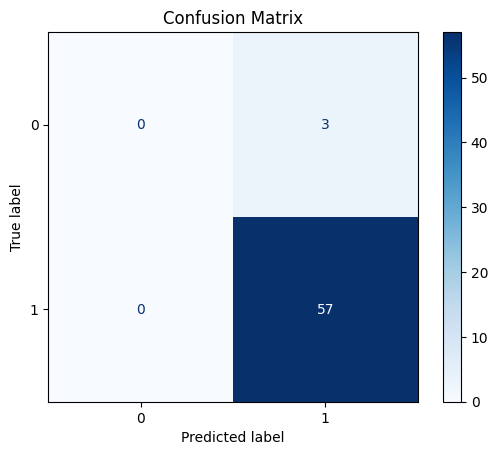

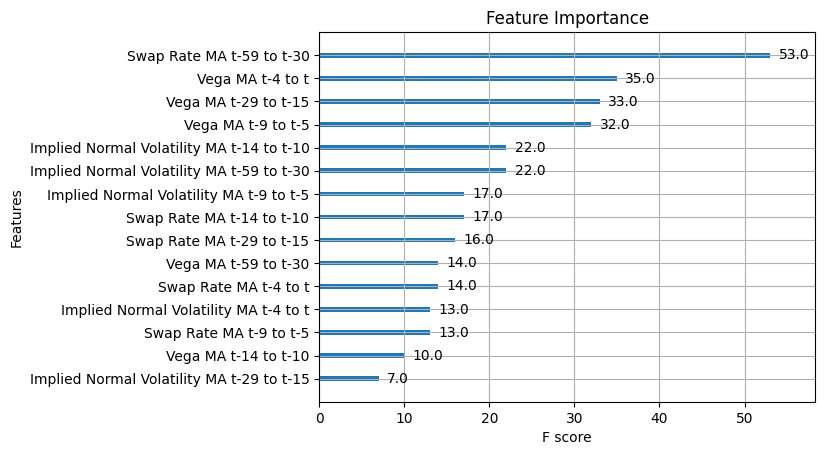

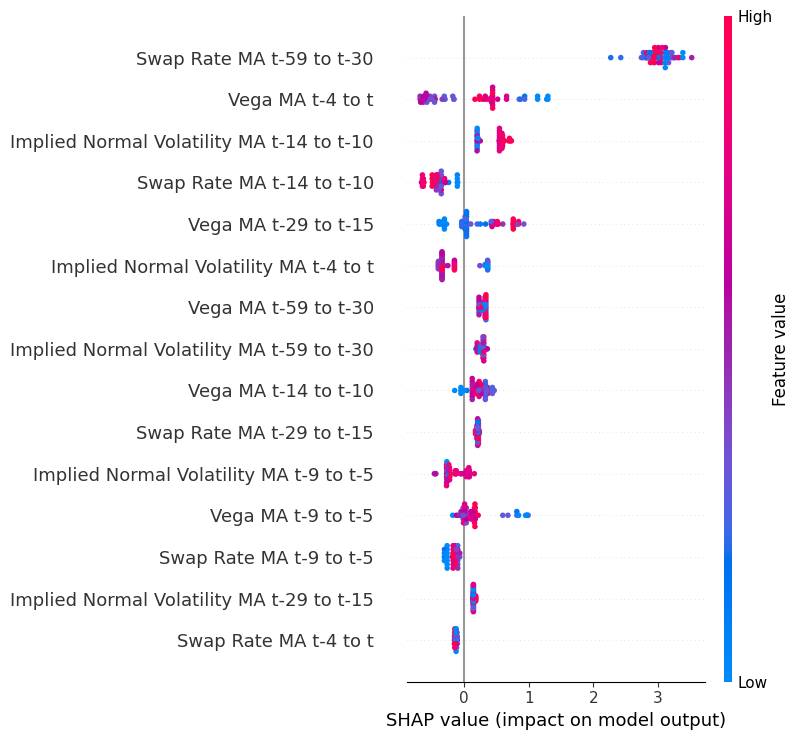

In [ ]:
# Select X variables and Y variable
continuous_vars = [
    'Swap Rate MA t-59 to t-30', 'Swap Rate MA t-29 to t-15', 'Swap Rate MA t-14 to t-10',
    'Swap Rate MA t-9 to t-5', 'Swap Rate MA t-4 to t',
    'Implied Normal Volatility MA t-59 to t-30', 'Implied Normal Volatility MA t-29 to t-15',
    'Implied Normal Volatility MA t-14 to t-10', 'Implied Normal Volatility MA t-9 to t-5',
    'Implied Normal Volatility MA t-4 to t',
    'Vega MA t-59 to t-30', 'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10',
    'Vega MA t-9 to t-5', 'Vega MA t-4 to t'
]

X_vars = continuous_vars
Y_var = 'Vega MA t+1 to t+5 Cluster 1'

# Drop rows where the Y variable is NaN
df = loaded_df.dropna(subset=[Y_var])

# Separate the last 60 non-NaN Y values for testing
test_data = df.iloc[-60:]
train_data = df.iloc[:-60]

X_train = train_data[X_vars]
y_train = train_data[Y_var]
X_test = test_data[X_vars]
y_test = test_data[Y_var]

# Train XGBoost model
model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Compute and visualize the confusion matrix
cm = confusion_matrix(y_test, y_pred, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

# Feature importance
xgb.plot_importance(model, importance_type='weight')
plt.title('Feature Importance')
plt.show()

# Visualize the quantitative impact of each X variable on the Y variable
explainer = shap.Explainer(model)
shap_values = explainer(X_test)

# Summary plot
shap.summary_plot(shap_values, X_test)

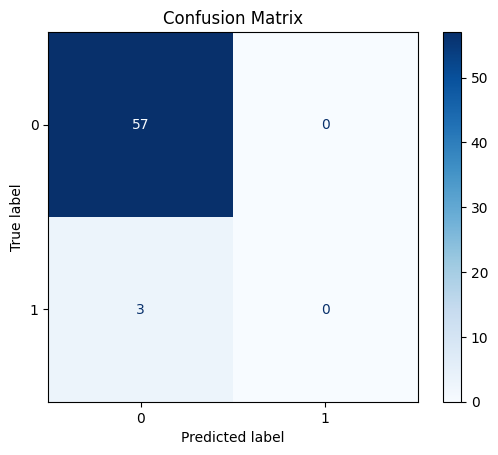

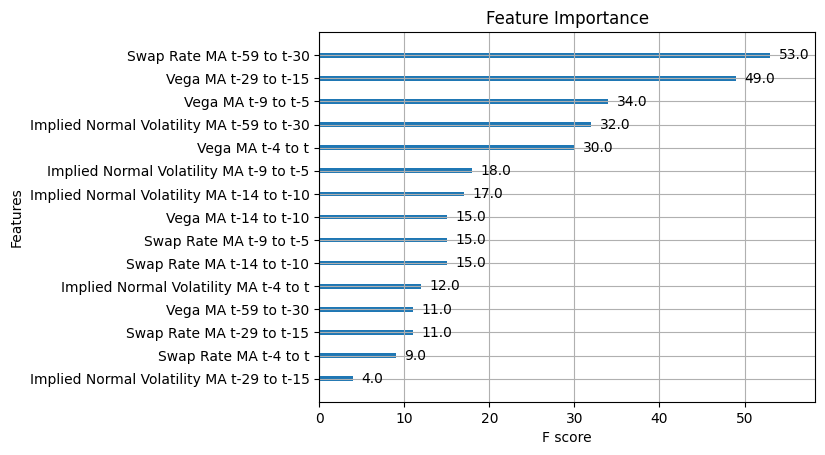

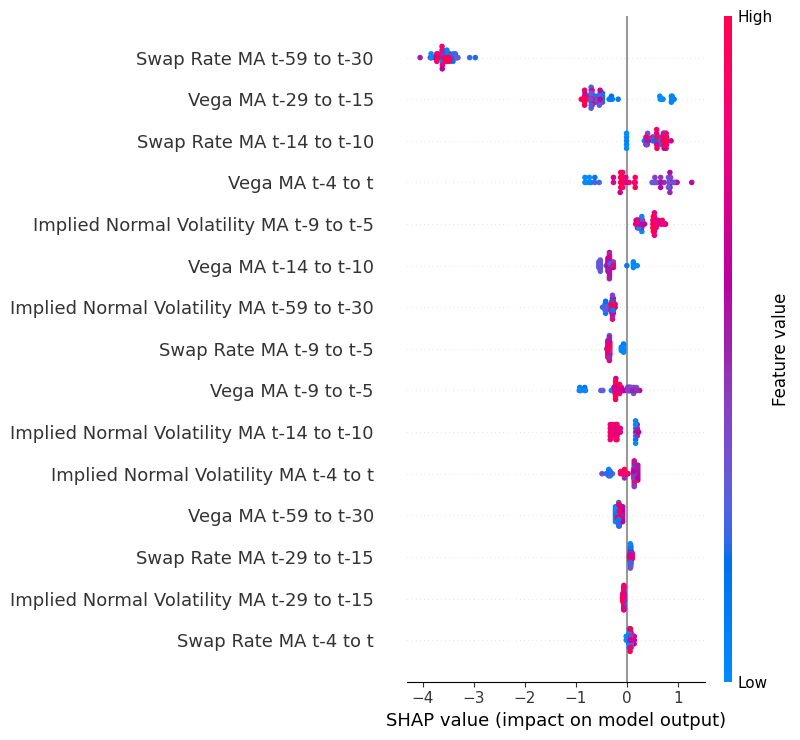

In [ ]:
# Select X variables and Y variable
continuous_vars = [
    'Swap Rate MA t-59 to t-30', 'Swap Rate MA t-29 to t-15', 'Swap Rate MA t-14 to t-10',
    'Swap Rate MA t-9 to t-5', 'Swap Rate MA t-4 to t',
    'Implied Normal Volatility MA t-59 to t-30', 'Implied Normal Volatility MA t-29 to t-15',
    'Implied Normal Volatility MA t-14 to t-10', 'Implied Normal Volatility MA t-9 to t-5',
    'Implied Normal Volatility MA t-4 to t',
    'Vega MA t-59 to t-30', 'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10',
    'Vega MA t-9 to t-5', 'Vega MA t-4 to t'
]

X_vars = continuous_vars
Y_var = 'Vega MA t+1 to t+5 Cluster 2'

# Drop rows where the Y variable is NaN
df = loaded_df.dropna(subset=[Y_var])

# Separate the last 60 non-NaN Y values for testing
test_data = df.iloc[-60:]
train_data = df.iloc[:-60]

X_train = train_data[X_vars]
y_train = train_data[Y_var]
X_test = test_data[X_vars]
y_test = test_data[Y_var]

# Train XGBoost model
model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Compute and visualize the confusion matrix
cm = confusion_matrix(y_test, y_pred, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

# Feature importance
xgb.plot_importance(model, importance_type='weight')
plt.title('Feature Importance')
plt.show()

# Visualize the quantitative impact of each X variable on the Y variable
explainer = shap.Explainer(model)
shap_values = explainer(X_test)

# Summary plot
shap.summary_plot(shap_values, X_test)

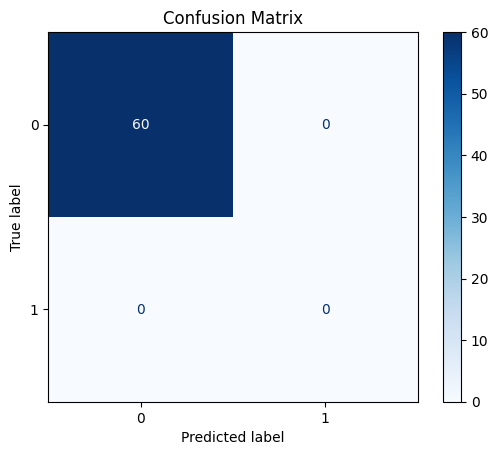

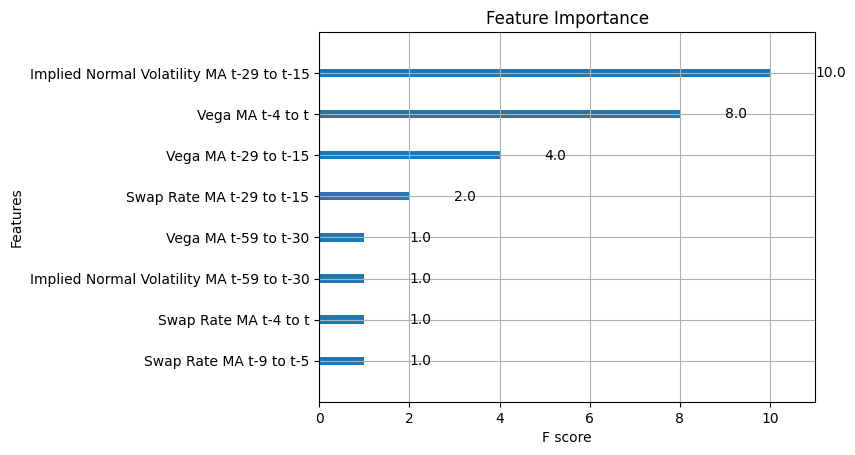

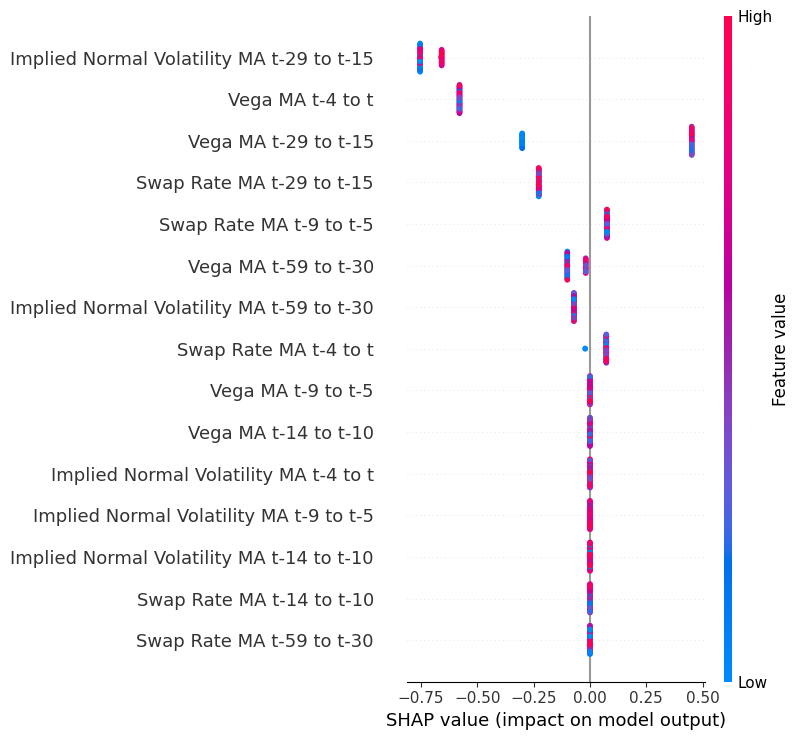

In [ ]:
# Select X variables and Y variable
continuous_vars = [
    'Swap Rate MA t-59 to t-30', 'Swap Rate MA t-29 to t-15', 'Swap Rate MA t-14 to t-10',
    'Swap Rate MA t-9 to t-5', 'Swap Rate MA t-4 to t',
    'Implied Normal Volatility MA t-59 to t-30', 'Implied Normal Volatility MA t-29 to t-15',
    'Implied Normal Volatility MA t-14 to t-10', 'Implied Normal Volatility MA t-9 to t-5',
    'Implied Normal Volatility MA t-4 to t',
    'Vega MA t-59 to t-30', 'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10',
    'Vega MA t-9 to t-5', 'Vega MA t-4 to t'
]

X_vars = continuous_vars
Y_var = 'Vega MA t+1 to t+5 Cluster 3'

# Drop rows where the Y variable is NaN
df = loaded_df.dropna(subset=[Y_var])

# Separate the last 60 non-NaN Y values for testing
test_data = df.iloc[-60:]
train_data = df.iloc[:-60]

X_train = train_data[X_vars]
y_train = train_data[Y_var]
X_test = test_data[X_vars]
y_test = test_data[Y_var]

# Train XGBoost model
model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Compute and visualize the confusion matrix
cm = confusion_matrix(y_test, y_pred, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

# Feature importance
xgb.plot_importance(model, importance_type='weight')
plt.title('Feature Importance')
plt.show()

# Visualize the quantitative impact of each X variable on the Y variable
explainer = shap.Explainer(model)
shap_values = explainer(X_test)

# Summary plot
shap.summary_plot(shap_values, X_test)

## XGBoost: Multi-class classification

### Case 1: X variables consist of continuous and one-hot variables (Use case 1)

<ipython-input-21-e60c430d43b8>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[Y_var] = df[Y_var] - 1


Accuracy: 0.95


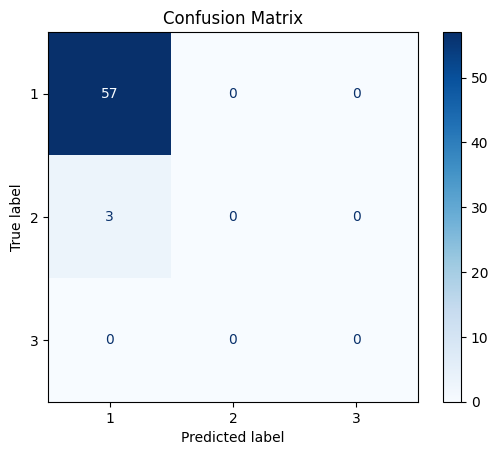

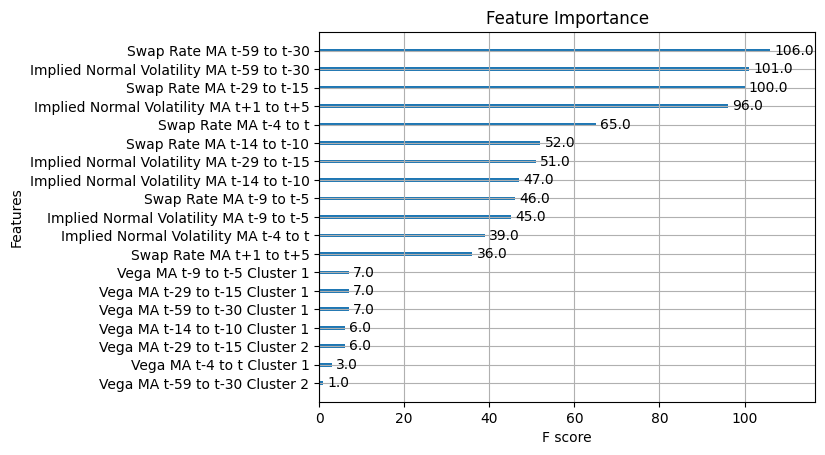

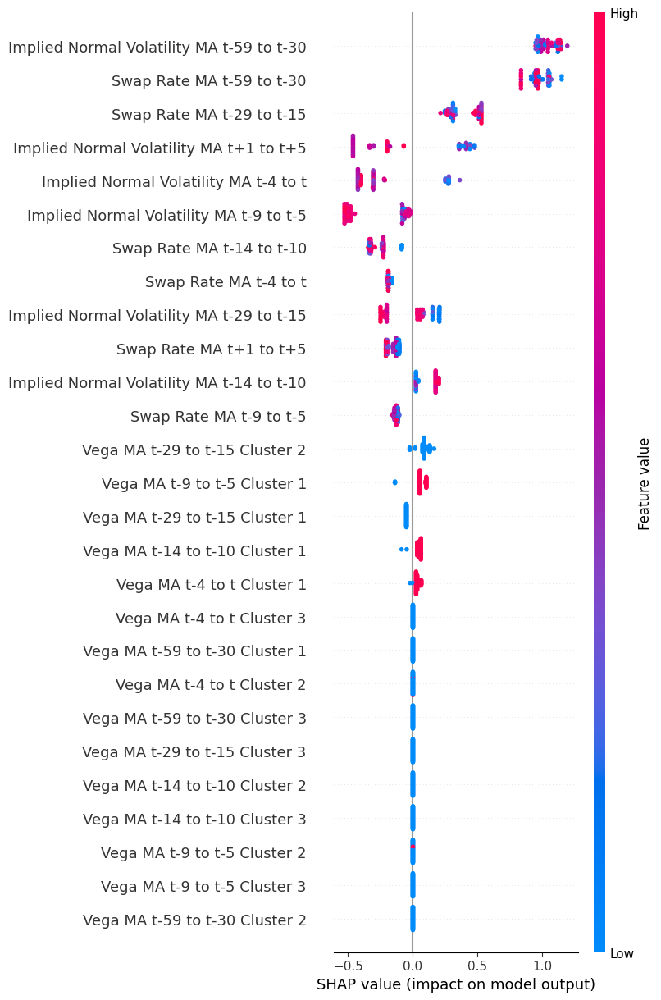

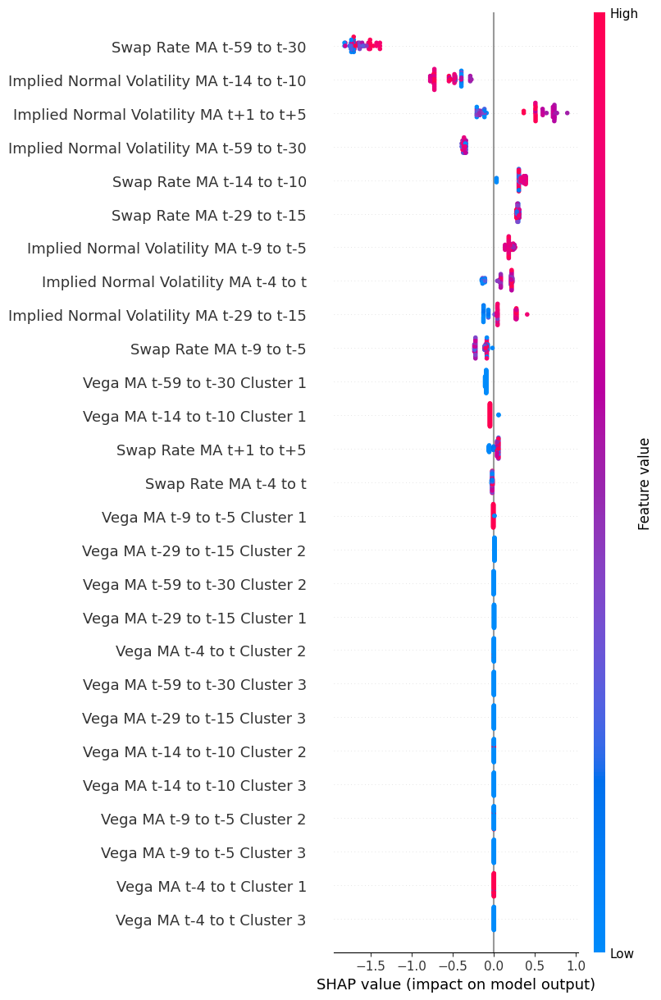

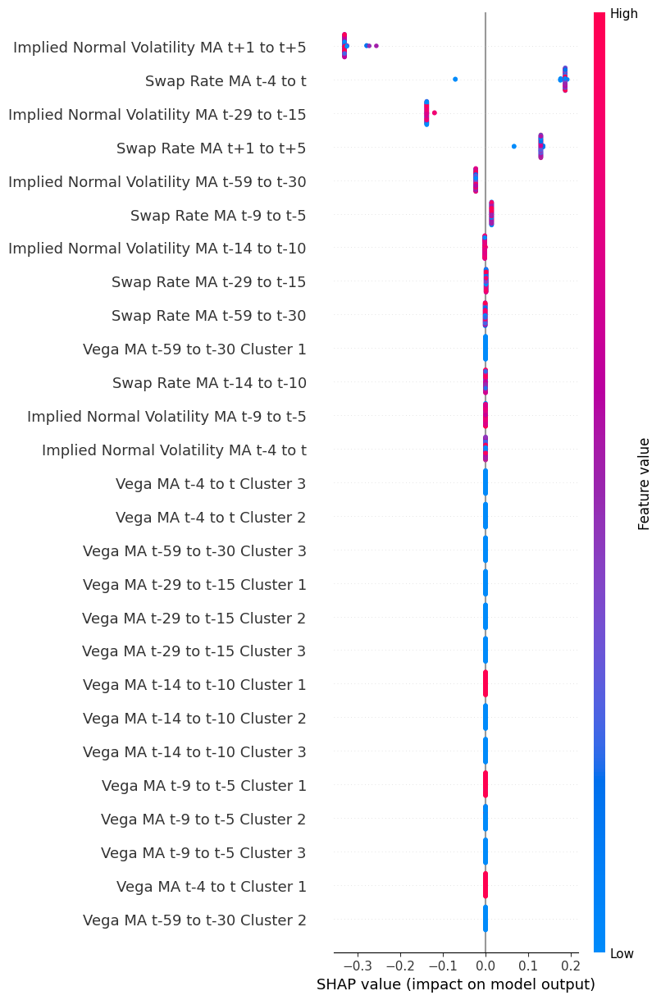

In [ ]:
# Select X variables and Y variable
continuous_vars = [
    'Swap Rate MA t-59 to t-30', 'Swap Rate MA t-29 to t-15', 'Swap Rate MA t-14 to t-10',
    'Swap Rate MA t-9 to t-5', 'Swap Rate MA t-4 to t', 'Swap Rate MA t+1 to t+5',
    'Implied Normal Volatility MA t-59 to t-30', 'Implied Normal Volatility MA t-29 to t-15',
    'Implied Normal Volatility MA t-14 to t-10', 'Implied Normal Volatility MA t-9 to t-5',
    'Implied Normal Volatility MA t-4 to t', 'Implied Normal Volatility MA t+1 to t+5'
]

one_hot_vars = [
    'Vega MA t-59 to t-30 Cluster 1', 'Vega MA t-59 to t-30 Cluster 2', 'Vega MA t-59 to t-30 Cluster 3',
    'Vega MA t-29 to t-15 Cluster 1', 'Vega MA t-29 to t-15 Cluster 2', 'Vega MA t-29 to t-15 Cluster 3',
    'Vega MA t-14 to t-10 Cluster 1', 'Vega MA t-14 to t-10 Cluster 2', 'Vega MA t-14 to t-10 Cluster 3',
    'Vega MA t-9 to t-5 Cluster 1', 'Vega MA t-9 to t-5 Cluster 2', 'Vega MA t-9 to t-5 Cluster 3',
    'Vega MA t-4 to t Cluster 1', 'Vega MA t-4 to t Cluster 2', 'Vega MA t-4 to t Cluster 3',
]

X_vars = continuous_vars + one_hot_vars
Y_var = 'Vega MA t+1 to t+5 Cluster'

# Drop rows where the Y variable is NaN
df = loaded_df.dropna(subset=[Y_var])

# Adjust the Y variable to start from 0
df[Y_var] = df[Y_var] - 1

# Separate the last 60 non-NaN Y values for testing
test_data = df.iloc[-60:]
train_data = df.iloc[:-60]

X_train = train_data[X_vars].astype(float)
y_train = train_data[Y_var]
X_test = test_data[X_vars].astype(float)
y_test = test_data[Y_var]

# Train XGBoost model
model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Compute accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Compute and visualize the confusion matrix
cm = confusion_matrix(y_test, y_pred, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[label + 1 for label in model.classes_])
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

# Feature importance
xgb.plot_importance(model, importance_type='weight')
plt.title('Feature Importance')
plt.show()

# Visualize the quantitative impact of each X variable on the Y variable
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# # Verify SHAP values shape and feature names
# print(f'SHAP values shape: {shap_values.shape}')
# print(f'Feature names: {X_test.columns}')

# Summary plot for each class
num_features = len(X_test.columns)

for class_idx in range(shap_values.shape[2]):
    shap.summary_plot(shap_values[:,:,class_idx], X_test, feature_names=X_test.columns.tolist(), max_display=num_features)

### Case 2: X variables consist of continuous variables only (Ignore case 2)

<ipython-input-22-e1473574c044>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[Y_var] = df[Y_var] - 1


Accuracy: 0.92


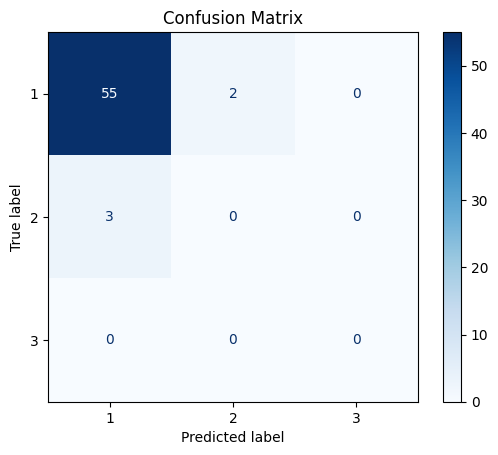

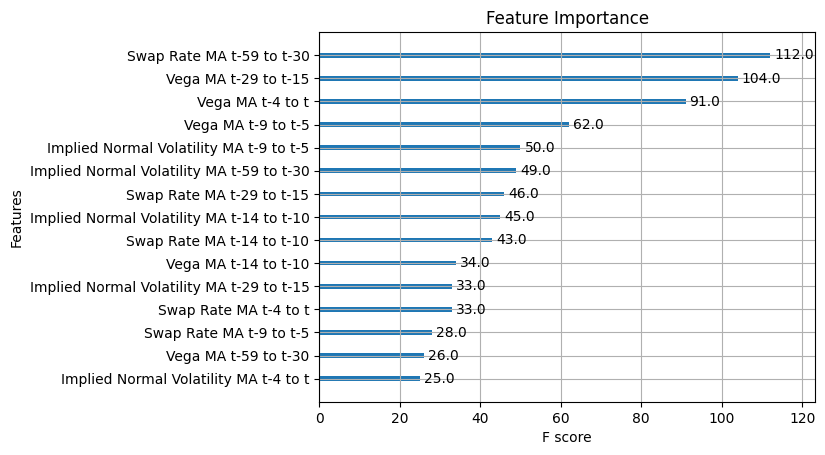

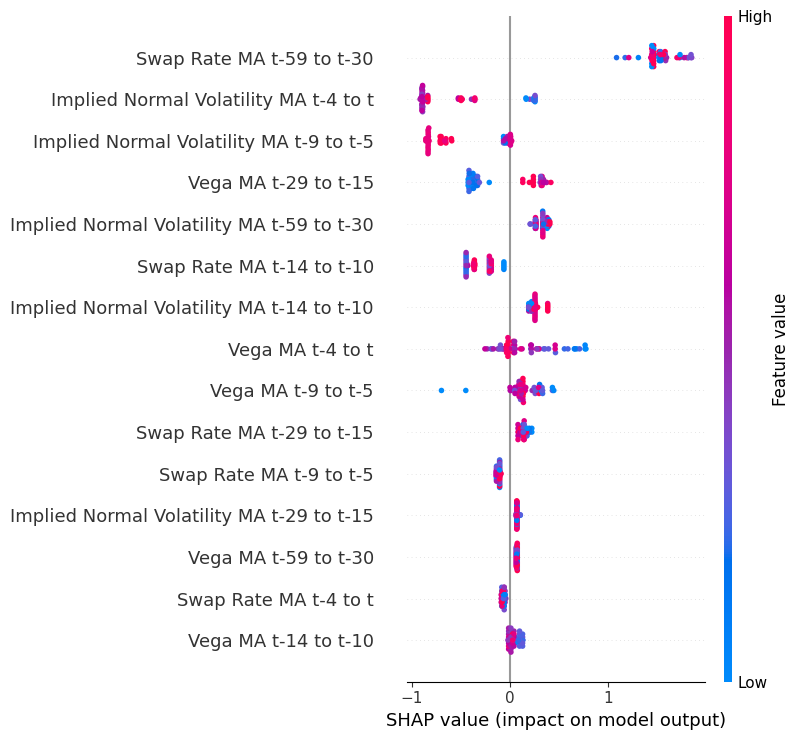

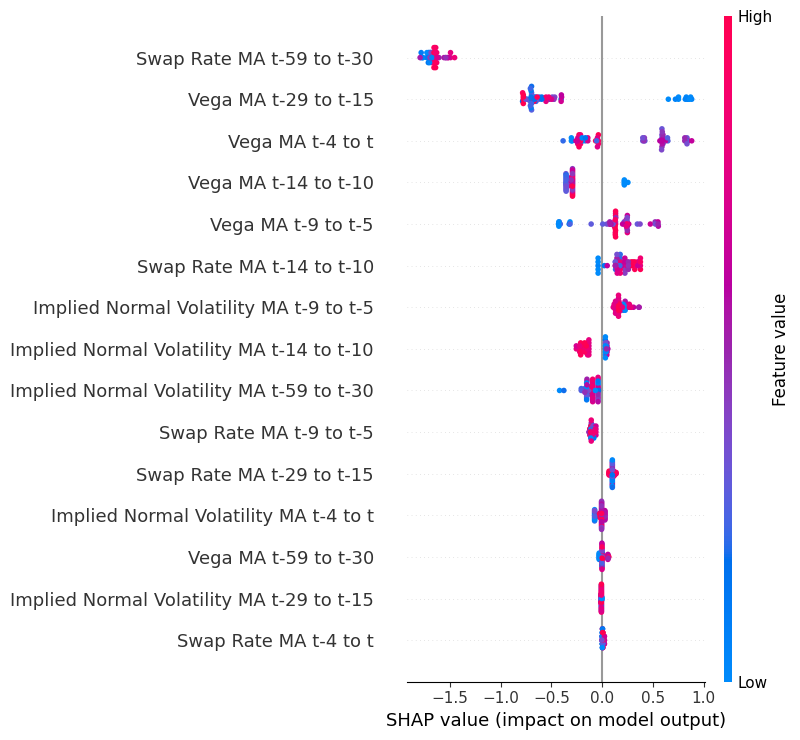

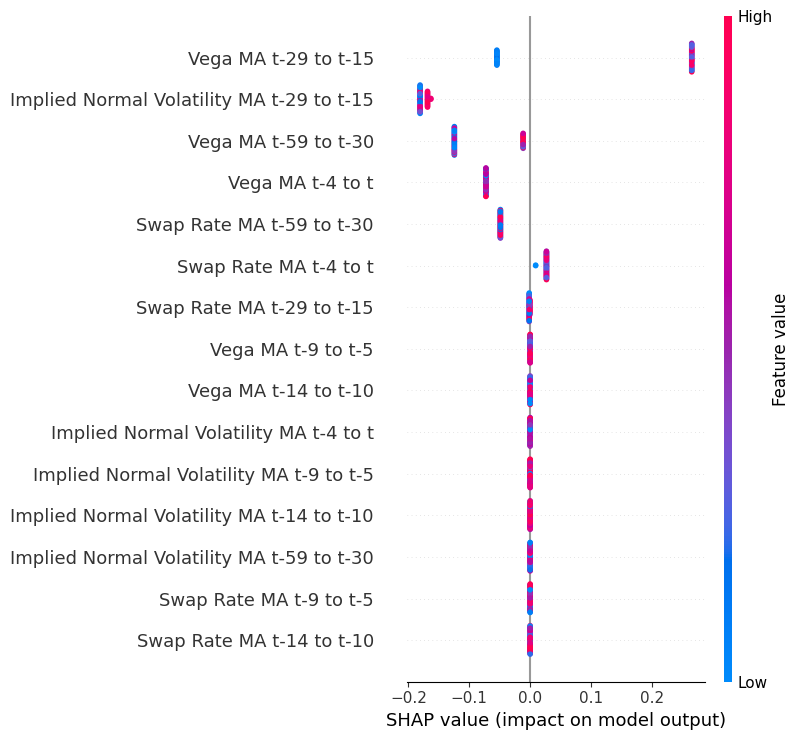

In [ ]:
# Select X variables and Y variable
continuous_vars = [
    'Swap Rate MA t-59 to t-30', 'Swap Rate MA t-29 to t-15', 'Swap Rate MA t-14 to t-10',
    'Swap Rate MA t-9 to t-5', 'Swap Rate MA t-4 to t',
    'Implied Normal Volatility MA t-59 to t-30', 'Implied Normal Volatility MA t-29 to t-15',
    'Implied Normal Volatility MA t-14 to t-10', 'Implied Normal Volatility MA t-9 to t-5',
    'Implied Normal Volatility MA t-4 to t',
    'Vega MA t-59 to t-30', 'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10',
    'Vega MA t-9 to t-5', 'Vega MA t-4 to t'
]

X_vars = continuous_vars
Y_var = 'Vega MA t+1 to t+5 Cluster'

# Drop rows where the Y variable is NaN
df = loaded_df.dropna(subset=[Y_var])

# Adjust the Y variable to start from 0
df[Y_var] = df[Y_var] - 1

# Separate the last 60 non-NaN Y values for testing
test_data = df.iloc[-60:]
train_data = df.iloc[:-60]

X_train = train_data[X_vars].astype(float)
y_train = train_data[Y_var]
X_test = test_data[X_vars].astype(float)
y_test = test_data[Y_var]

# Train XGBoost model
model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Compute accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Compute and visualize the confusion matrix
cm = confusion_matrix(y_test, y_pred, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[label + 1 for label in model.classes_])
disp.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

# Feature importance
xgb.plot_importance(model, importance_type='weight')
plt.title('Feature Importance')
plt.show()

# Visualize the quantitative impact of each X variable on the Y variable
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# # Verify SHAP values shape and feature names
# print(f'SHAP values shape: {shap_values.shape}')
# print(f'Feature names: {X_test.columns}')

# Summary plot for each class
num_features = len(X_test.columns)

for class_idx in range(shap_values.shape[2]):
    shap.summary_plot(shap_values[:,:,class_idx], X_test, feature_names=X_test.columns.tolist(), max_display=num_features)

## XGBoost: Prediction

### Plot 1 for "Actual vs Predicted Vega MA t+1 to t+5"

689    2023-10-16
690    2023-10-17
691    2023-10-18
692    2023-10-19
693    2023-10-20
694    2023-10-23
695    2023-10-24
696    2023-10-25
697    2023-10-26
698    2023-10-27
699    2023-10-30
700    2023-10-31
701    2023-11-01
702    2023-11-02
703    2023-11-03
704    2023-11-06
705    2023-11-07
706    2023-11-08
707    2023-11-09
708    2023-11-10
709    2023-11-13
710    2023-11-14
711    2023-11-15
712    2023-11-16
713    2023-11-17
714    2023-11-20
715    2023-11-21
716    2023-11-22
717    2023-11-23
718    2023-11-24
719    2023-11-27
720    2023-11-28
721    2023-11-29
722    2023-11-30
723    2023-12-01
724    2023-12-04
725    2023-12-05
726    2023-12-06
727    2023-12-07
728    2023-12-08
729    2023-12-11
730    2023-12-12
731    2023-12-13
732    2023-12-14
733    2023-12-15
734    2023-12-18
735    2023-12-19
736    2023-12-20
737    2023-12-21
738    2023-12-22
739    2023-12-25
740    2023-12-26
741    2023-12-27
742    2023-12-28
743    2023-12-29
744    202

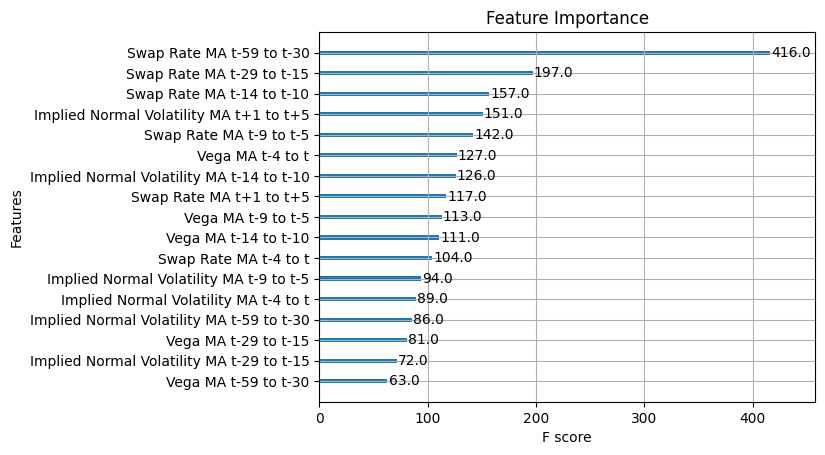

SHAP values shape: (60, 17)
Feature names: Index(['Swap Rate MA t-59 to t-30', 'Swap Rate MA t-29 to t-15',
       'Swap Rate MA t-14 to t-10', 'Swap Rate MA t-9 to t-5',
       'Swap Rate MA t-4 to t', 'Swap Rate MA t+1 to t+5',
       'Implied Normal Volatility MA t-59 to t-30',
       'Implied Normal Volatility MA t-29 to t-15',
       'Implied Normal Volatility MA t-14 to t-10',
       'Implied Normal Volatility MA t-9 to t-5',
       'Implied Normal Volatility MA t-4 to t',
       'Implied Normal Volatility MA t+1 to t+5', 'Vega MA t-59 to t-30',
       'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10', 'Vega MA t-9 to t-5',
       'Vega MA t-4 to t'],
      dtype='object')


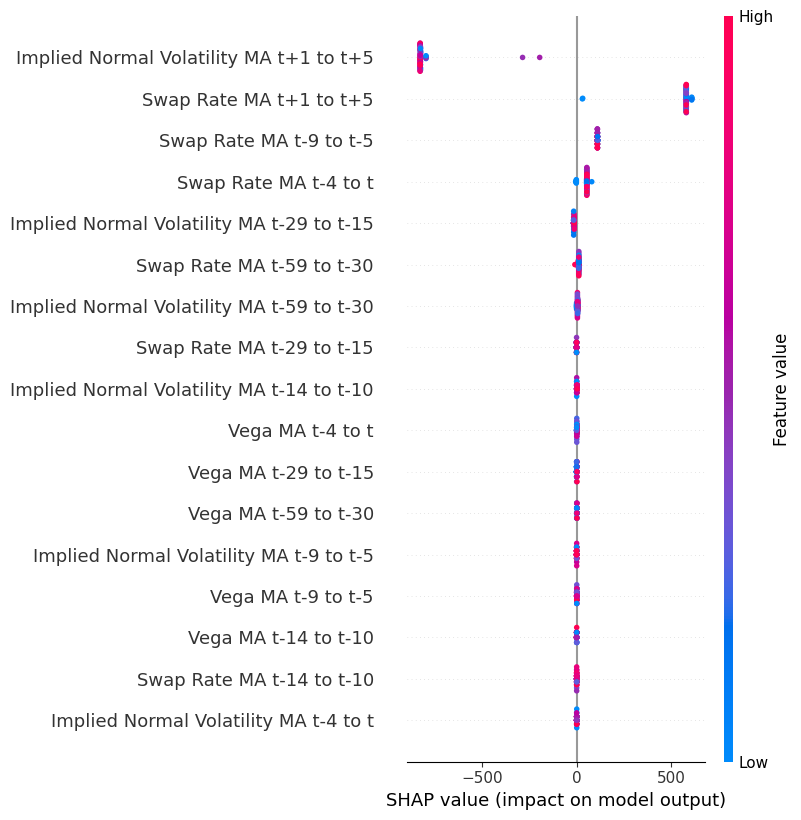

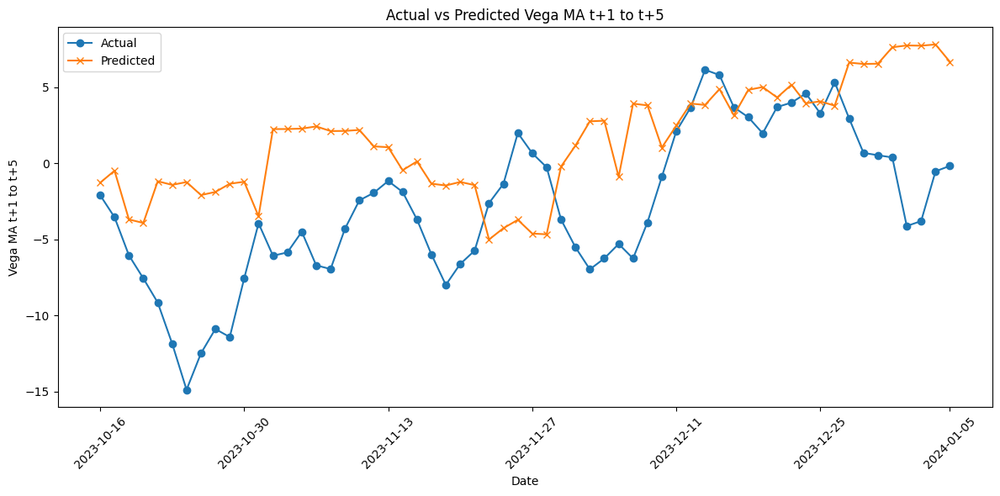

In [ ]:
# Select X variables and Y variable
continuous_vars = [
    'Swap Rate MA t-59 to t-30', 'Swap Rate MA t-29 to t-15', 'Swap Rate MA t-14 to t-10',
    'Swap Rate MA t-9 to t-5', 'Swap Rate MA t-4 to t', 'Swap Rate MA t+1 to t+5',
    'Implied Normal Volatility MA t-59 to t-30', 'Implied Normal Volatility MA t-29 to t-15',
    'Implied Normal Volatility MA t-14 to t-10', 'Implied Normal Volatility MA t-9 to t-5',
    'Implied Normal Volatility MA t-4 to t', 'Implied Normal Volatility MA t+1 to t+5',
    'Vega MA t-59 to t-30', 'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10',
    'Vega MA t-9 to t-5', 'Vega MA t-4 to t'
]

X_vars = continuous_vars
Y_var = 'Vega MA t+1 to t+5'

# Drop rows where the Y variable is NaN
df = loaded_df.dropna(subset=[Y_var])

# Separate the last 60 non-NaN Y values for testing
test_data = df.iloc[-60:]
train_data = df.iloc[:-60]

X_train = train_data[X_vars].astype(float)
y_train = train_data[Y_var]
X_test = test_data[X_vars].astype(float)
y_test = test_data[Y_var]

# Train XGBoost model
model = xgb.XGBRegressor(eval_metric='rmse')
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# print results
print(test_data['Date'])
print(y_pred)

# Compute and display error metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Squared Error: {mse:.2f}")
print(f"Mean Absolute Error: {mae:.2f}")

# Feature importance
xgb.plot_importance(model, importance_type='weight')
plt.title('Feature Importance')
plt.show()

# Visualize the quantitative impact of each X variable on the Y variable
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Verify SHAP values shape and feature names
print(f'SHAP values shape: {shap_values.shape}')
print(f'Feature names: {X_test.columns}')

# Summary plot
shap.summary_plot(shap_values, X_test, feature_names=X_test.columns.tolist())

# Plot actual vs. predicted values
plt.figure(figsize=(12, 6))
plt.plot(test_data['Date'], y_test, label='Actual', marker='o')
plt.plot(test_data['Date'], y_pred, label='Predicted', marker='x')

# Customize x-ticks to show date for every 10 entries and the last date
date_ticks = test_data['Date'].iloc[::10].tolist()
if test_data['Date'].iloc[-1] not in date_ticks:
    date_ticks.append(test_data['Date'].iloc[-1])
plt.xticks(date_ticks, rotation=45)

plt.xlabel('Date')
plt.ylabel(Y_var)
plt.title(f'Actual vs Predicted {Y_var}')
plt.legend()
plt.tight_layout()
plt.show()

### Plot 2 for "Actual vs Predicted Vega MA t+1 to t+5"

689    2023-10-16
690    2023-10-17
691    2023-10-18
692    2023-10-19
693    2023-10-20
694    2023-10-23
695    2023-10-24
696    2023-10-25
697    2023-10-26
698    2023-10-27
699    2023-10-30
700    2023-10-31
701    2023-11-01
702    2023-11-02
703    2023-11-03
704    2023-11-06
705    2023-11-07
706    2023-11-08
707    2023-11-09
708    2023-11-10
709    2023-11-13
710    2023-11-14
711    2023-11-15
712    2023-11-16
713    2023-11-17
714    2023-11-20
715    2023-11-21
716    2023-11-22
717    2023-11-23
718    2023-11-24
719    2023-11-27
720    2023-11-28
721    2023-11-29
722    2023-11-30
723    2023-12-01
724    2023-12-04
725    2023-12-05
726    2023-12-06
727    2023-12-07
728    2023-12-08
729    2023-12-11
730    2023-12-12
731    2023-12-13
732    2023-12-14
733    2023-12-15
734    2023-12-18
735    2023-12-19
736    2023-12-20
737    2023-12-21
738    2023-12-22
739    2023-12-25
740    2023-12-26
741    2023-12-27
742    2023-12-28
743    2023-12-29
744    202

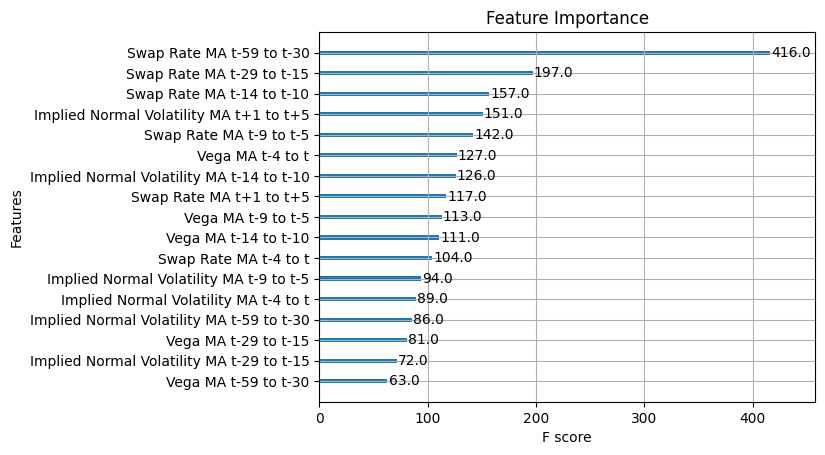

SHAP values shape: (60, 17)
Feature names: Index(['Swap Rate MA t-59 to t-30', 'Swap Rate MA t-29 to t-15',
       'Swap Rate MA t-14 to t-10', 'Swap Rate MA t-9 to t-5',
       'Swap Rate MA t-4 to t', 'Swap Rate MA t+1 to t+5',
       'Implied Normal Volatility MA t-59 to t-30',
       'Implied Normal Volatility MA t-29 to t-15',
       'Implied Normal Volatility MA t-14 to t-10',
       'Implied Normal Volatility MA t-9 to t-5',
       'Implied Normal Volatility MA t-4 to t',
       'Implied Normal Volatility MA t+1 to t+5', 'Vega MA t-59 to t-30',
       'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10', 'Vega MA t-9 to t-5',
       'Vega MA t-4 to t'],
      dtype='object')


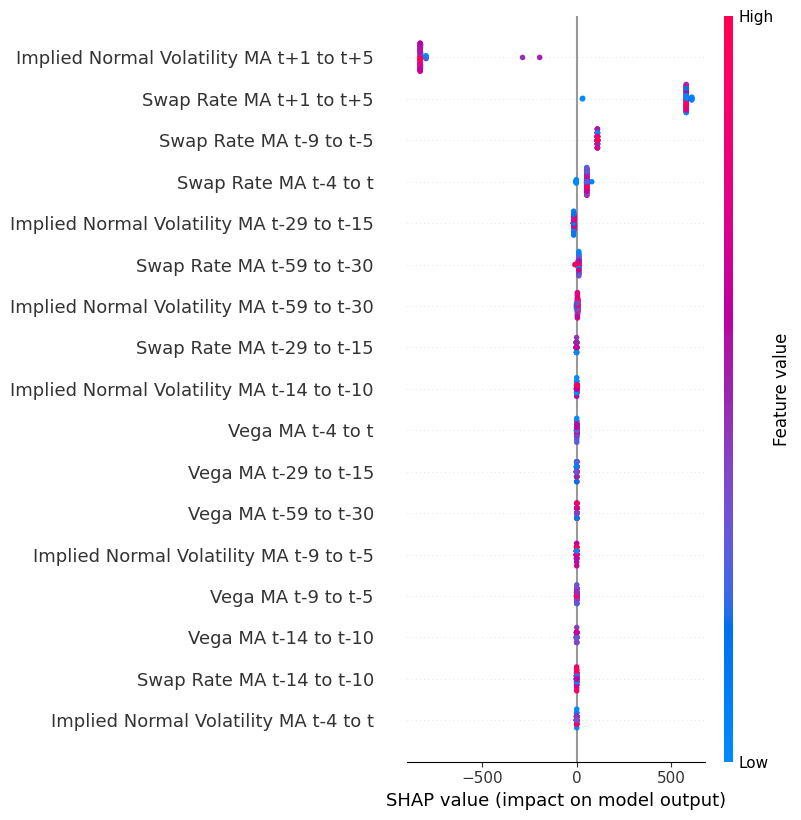

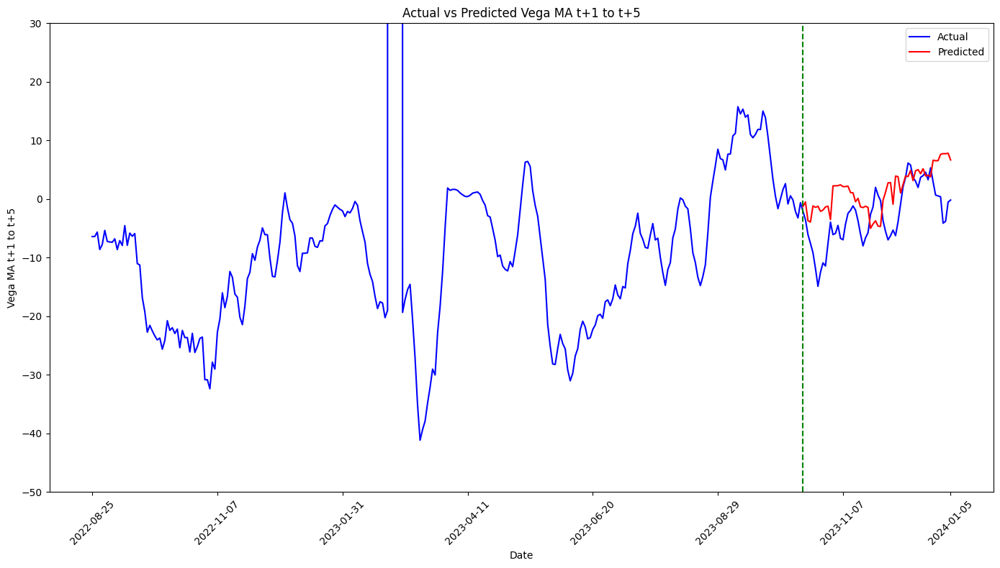

In [ ]:
# Select X variables and Y variable
continuous_vars = [
    'Swap Rate MA t-59 to t-30', 'Swap Rate MA t-29 to t-15', 'Swap Rate MA t-14 to t-10',
    'Swap Rate MA t-9 to t-5', 'Swap Rate MA t-4 to t', 'Swap Rate MA t+1 to t+5',
    'Implied Normal Volatility MA t-59 to t-30', 'Implied Normal Volatility MA t-29 to t-15',
    'Implied Normal Volatility MA t-14 to t-10', 'Implied Normal Volatility MA t-9 to t-5',
    'Implied Normal Volatility MA t-4 to t', 'Implied Normal Volatility MA t+1 to t+5',
    'Vega MA t-59 to t-30', 'Vega MA t-29 to t-15', 'Vega MA t-14 to t-10',
    'Vega MA t-9 to t-5', 'Vega MA t-4 to t'
]

X_vars = continuous_vars
Y_var = 'Vega MA t+1 to t+5'

# Drop rows where the Y variable is NaN
df = loaded_df.dropna(subset=[Y_var])

# Separate the last 60 non-NaN Y values for testing
test_data = df.iloc[-60:]
train_data = df.iloc[:-60]

X_train = train_data[X_vars].astype(float)
y_train = train_data[Y_var]
X_test = test_data[X_vars].astype(float)
y_test = test_data[Y_var]

# Train XGBoost model
model = xgb.XGBRegressor(eval_metric='rmse')
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# print results
print(test_data['Date'])
print(y_pred)

# Compute and display error metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Squared Error: {mse:.2f}")
print(f"Mean Absolute Error: {mae:.2f}")

# Feature importance
xgb.plot_importance(model, importance_type='weight')
plt.title('Feature Importance')
plt.show()

# Visualize the quantitative impact of each X variable on the Y variable
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Verify SHAP values shape and feature names
print(f'SHAP values shape: {shap_values.shape}')
print(f'Feature names: {X_test.columns}')

# Summary plot
shap.summary_plot(shap_values, X_test, feature_names=X_test.columns.tolist())

# Plot actual vs. predicted values
plt.figure(figsize=(14, 8))

# Plot the entire actual Y data
plt.plot(df['Date'], df[Y_var], label='Actual', color='blue')

# Plot the predicted Y data for the test period
plt.plot(test_data['Date'], y_pred, label='Predicted', color='red')

# Customize ylim
plt.ylim(-50, 30)

# Draw vertical line at the last 60th Date
plt.axvline(x=test_data['Date'].iloc[0], color='green', linestyle='--')

# Customize x-ticks to show date for every 50 entries and the last date
date_ticks = df['Date'].iloc[::50].tolist()
if df['Date'].iloc[-1] not in date_ticks:
    date_ticks.append(df['Date'].iloc[-1])
plt.xticks(date_ticks, rotation=45)

plt.xlabel('Date')
plt.ylabel(Y_var)
plt.title(f'Actual vs Predicted {Y_var}')
plt.legend()
plt.tight_layout()
plt.show()